<a href="https://colab.research.google.com/github/ArnauCodesV2/Algorithms-Coursework/blob/main/abrm.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Coursework 1: Learning Learning, From Scratch

_COMP0169 Team_

__Niloy J. Mitra & Tobias Ritschel__

TAs:  __Remy Sabathier, Yilin Liu & Zican Wang__

The total points for this exercise is 100.

Please refer to Moodle submission page for the due date.


## Submission instructions:

Coursework submissions must comprise of a zipped folder. Inside this zip, you should have two things.


1.   This Jupyter notebook, containing your code and written comments.
2.   A "models/" folder, containing your trained model weights.


 In the notebook, cells that need to be changed are clearly stated with a &#9998; symbol and you are not allowed to change the rest of the code in any way. Descriptive answers must be contained in the markdown blocks starting with "_Your reply_:". Code must only be written in the space inside the `#begin_solution ... #end_solution` blocks. Code written outside these blocks will not be processed or evaluated.

Please, do not change `#begin_test ... #end_test` blocks, these blocks are for TAs.

Each exercise must be implemented from scratch. Unless differently specified, only numpy and matplotlib are allowed. The libraries are imported in [the package cell](#packages) and cannot be modified.



**Questions:**

[Question 1](#question1): Linear Fitting (10 points)

[Question 2](#question2): Image retrieval (15 points)

[Question 3](#question3): Image Denoising (30 points)

[Question 4](#question4): Texture Synthesis (15 points)

[Question 5](#question5): Neural Implicit Representation (30 points)

## Datasets

We will be using several datasets for the coursework: _IRIS_ , _MNIST_ , _CelebA_ , _NoisyOCR_.

_IRIS_ and _MNIST_ datasets will be downloaded directly in the notebook using the `skdataset` library. Keep in mind that you will need to be connected to Internet to be able to download the datasets. If you want to work offline, you are free to save your dataset to npy file locally and load them while offline although this is not officially supported.

_CelebA_ and _NoisyOCR_ are provided separately in a zip file; make sure to unzip it and the unzipped folder is placed in the same directory as the notebook.


**_IRIS_**: The _IRIS_ dataset contains the following features in order: _sepal length_, _sepal width_, _petal length_, _petal width_. Classes names are: __Iris Setosa__ for label **0**, __Iris Versicolour__ for label **1**, and __Iris Virginica__ for label **2**.

**_MNIST_**: _MNIST_ is a dataset composed of images of handwritten digits.

**_NoisyOCR_**: _NoisyOCR_ is a dataset composed of
images of noisy OCR scans, along with corresponding clean target images.

The script will generate two subsets for each of the two datasets, a training subset (**X\_dataset** and **Y\_dataset** with **dataset** the name of the dataset) and a test subset (**X\_dataset\_test** and **Y\_dataset\_test**).

We will test correctness of your code on _Hidden_ set.

**Warning:** as _Hidden_ may have different dimensions from _IRIS_ and _MNIST_, hard-coded solutions may not work, thus resulting in lower grades. You need to make sure that your code would work if applied on a different number of samples and a different number of features/pixels.

## Instructions for the other datasets zip file:
**Download Link:** https://geometry.cs.ucl.ac.uk/mlvc/cw_datasets.zip

You can download this zip locally, unzip it and keep the folder in the same directory as your Notebook. There is code provided below to download and unzip it. If you're using Colab, the downloaded content will remain only while the session is active. When you start a new session, you'd have to download it again.

**Google Drive:** For a more permanent solution, you can upload the *unzipped* folder to your own Google Drive, and mount your drive in the notebook. Code is provided below, to mount the drive.

You can use either options, and a variable `drive_mount` is provided to toggle between the two. Set this variable accordingly.

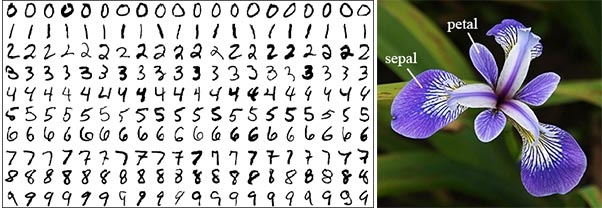

The following cell imports all packages needed in the coursework. You are not allowed to use any other packages than the ones listed below.
<a name='packages'></a>

In [1]:
# Importing packages
import numpy as np
import random
import os

import matplotlib.pyplot as plt

from scipy import optimize
from sklearn import datasets as skdataset
from sklearn.model_selection import train_test_split
from pathlib import Path

import os
from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import torch.nn.functional as F
from torch.utils.data import Dataset

import imageio
from PIL import Image
import cv2

from tqdm import tqdm
from skimage.metrics import peak_signal_noise_ratio
from IPython.display import Video

from torchvision import models, transforms
%matplotlib inline

The following code imports the drive module from Colab. This code will only run on Colab. If you're not using Colab, comment this code out, or don't run this cell.

In [2]:
from google.colab import drive

#Unmount any previously mounted drive if needed.
#Feel free to uncomment below line when you need to unmount Drive

drive.flush_and_unmount()

Drive not mounted, so nothing to flush and unmount.


The following cell sets the `drive_mount` variable. Set it to `True` if your Dataset folder is on drive. If you plan to use the Dataset folder locally, then set this to `False`

In [3]:
drive_mount = False

In [4]:
# Setting the seed
RAND_ST = 42
random.seed(RAND_ST)
#begin_test

#end_test



## Data Loading

The following cells are used to load IRIS and MNIST datasets.

In [5]:
def load_iris_dataset(num_classes=2):
    # Load the datadet from SkDataset
    iris = skdataset.load_iris()
    X = iris.data
    Y = iris.target
    # Reduce the number of classes
    idx = Y < num_classes
    X = X[idx]
    Y = Y[idx]
    return X, Y

In [6]:
def load_mnist_dataset(num_classes=2):
    # Load the datadet from SkDataset
    X, Y = skdataset.fetch_openml('mnist_784', version=1, return_X_y=True,as_frame=False)
    Y = Y.astype(np.int64)
    # Reduce the number of classes
    idx = Y < num_classes
    X = X[idx]
    Y = Y[idx]
    return X, Y

def load_mnist_dataset_onevsall(class_id=7):
    # Load the datadet from SkDataset
    X, Y = skdataset.fetch_openml('mnist_784', version=1, return_X_y=True,as_frame=False)
    Y = Y.astype(np.int64)
    # One versus all
    idx = Y == class_id
    Y[~idx] = 0
    Y[idx]  = 1
    return X, Y

## Functions for visualization

In [7]:
def plot_correlation(X1, X2):
    # Plot both variables
    plt.figure(figsize=(8, 6))
    plt.clf()
    plt.scatter(X1, X2, edgecolor='k')
    line = np.linspace(min(X1.min(), X2.min()), max(X1.max(), X2.max()), 20)
    plt.plot(line, line, 'r')
    plt.xlabel('Variable 1')
    plt.ylabel('Variable 2')
    plt.show()

In [8]:
def plot_eigenvecs(stacked_images, n_rows, n_columns, img_shape=None, channels=1):
    n_images, n_dims = stacked_images.shape
    plt.figure()
    for i in range(n_rows * n_columns):
        plt.subplot(n_rows, n_columns, i + 1)
        if channels == 1:
            # Normalize eigen vector to [0, 255] range
            eigenvector = stacked_images[i] - np.min(stacked_images[i])
            eigenvector /= np.max(eigenvector) + 1e-8
            eigenvector = (eigenvector * 255).astype(np.uint8)
            plt.imshow(np.reshape(eigenvector, [int(np.sqrt(n_dims)), int(np.sqrt(n_dims))]), cmap='gray')
        elif channels == 3:
            # Normalize eigen vector to [0, 255] range for each channel
            eigenvector = stacked_images[i].reshape(img_shape[0], img_shape[1], 3)
            eigenvector -= np.min(eigenvector)
            eigenvector /= np.max(eigenvector) + 1e-8
            eigenvector = (eigenvector * 255).astype(np.uint8)
            plt.imshow(eigenvector)
        plt.axis('off')
    plt.show()

def plot_images(stacked_images, n_rows, n_columns, titles, num_channels=1):
    n_images, n_dims = stacked_images.shape
    plt.figure()
    for i in range(n_rows * n_columns):
        plt.subplot(n_rows, n_columns, i + 1)

        if num_channels == 1:
            # Grayscale image
            plt.imshow(np.reshape(stacked_images[i], [int(np.sqrt(n_dims)), int(np.sqrt(n_dims))]), cmap='gray', vmin=0, vmax=1)
        elif num_channels == 3:
            # RGB image
            image = np.reshape(stacked_images[i], [int(np.sqrt(n_dims // 3)), int(np.sqrt(n_dims // 3)), 3])
            image = np.clip(image, 0, 1)  # Ensure pixel values are within [0, 1] range
            plt.imshow(image)
        else:
            raise ValueError("Unsupported number of channels. Use num_channels=1 for grayscale or num_channels=3 for RGB.")

        plt.axis('off')

        if len(titles) == n_rows * n_columns:
            plt.title(titles[i])

    plt.show()

def plot_images_with_text(images, titles, texts=None):
    N_cols = len(images)
    N_rows = len(images[0])

    fig, axs = plt.subplots(N_rows, N_cols, figsize=(20, 15))

    if titles is not None:
        for i, ax in enumerate(axs[0]):
            ax.set_title(titles[i])

    for i, img_col in enumerate(images):
        for j, img in enumerate(img_col):
            if len(img.shape) == 2:
                axs[j,i].imshow(img, interpolation='nearest', cmap='gray')
            else:
                axs[j,i].imshow(img, interpolation='nearest')
            axs[j,i].axis('off')
            if texts is not None:
                axs[j,i].text(0.5,-0.1, str(texts[j][i])[:4], size=10, ha="center", transform=axs[j,i].transAxes)
    plt.show()


In [9]:
def plot_images_horizontal(imgs):
    num_imgs = len(imgs)
    f = plt.figure(figsize=(40, 15))
    for i in range(num_imgs):
        f.add_subplot(1, num_imgs, i+1)
        plt.imshow(imgs[i])
    plt.show()

In [10]:
def true_positive(Y_test, y_pred):
    mask = (Y_test == 1)
    tp = (Y_test[mask] == y_pred[mask]).sum()
    return tp.item()

def true_negative(Y_test, y_pred):
    mask = (Y_test == 0) | (Y_test == -1)
    tn = (Y_test[mask] == y_pred[mask]).sum()
    return tn.item()

def false_negative(Y_test, y_pred):
    mask = (y_pred == 0) | (y_pred == -1)
    tn = (Y_test[mask] != y_pred[mask]).sum()
    return tn.item()

def false_positive(Y_test, y_pred):
    mask = (y_pred == 1)
    tn = (Y_test[mask] != y_pred[mask]).sum()
    return tn.item()

def plot_confusion_matrix(Y_test, y_pred):
    tp = true_positive(Y_test, y_pred)
    tn = true_negative(Y_test, y_pred)
    fp = false_positive(Y_test, y_pred)
    fn = false_negative(Y_test, y_pred)
    cf = np.array([[tn, fp], [fn, tp]])
    fig, ax = plt.subplots()
    ax.matshow(cf, cmap=plt.cm.Blues)
    for i in range(2):
        for j in range(2):
            c = cf[i,j]
            ax.text(j, i, str(c), va='center', ha='center')
    plt.xlabel('Prediction')
    plt.ylabel('Target')
    plt.show()

## Data Loading

In the following cells, the dataset is created with proper splits between training and test set.

_IRIS_ dataset

In [11]:
X, Y = load_iris_dataset(num_classes=3)
X_iris, X_iris_test, Y_iris, Y_iris_test = train_test_split(X, Y, test_size=0.1, random_state=RAND_ST) # 90% training and 10% test

_MNIST_ **dataset**

In [12]:
X, Y = load_mnist_dataset(num_classes=10)
X = X / 255.0
X_mnist, X_mnist_test, Y_mnist, Y_mnist_test = train_test_split(X, Y, test_size=0.1, random_state=RAND_ST) # 90% training and 10% test

**Code for handling the Dataset zip file**

The following cell mounts your drive if `drive_mount` is `True`

In [13]:
if drive_mount:
  drive.mount('/content/drive')

Set `dataset_path` to Drive or local directory.

In [14]:
if drive_mount:
  dataset_path = '/content/drive/MyDrive/cw_datasets/'
  assert(os.path.exists(dataset_path))
  # Set this path to your appropriate drive path
else:
  dataset_path = "./cw_datasets"
  # In this case, the datasets path is assumed to be in the same directory as this notebook

  if not os.path.exists("./cw_datasets"):
    !wget https://geometry.cs.ucl.ac.uk/mlvc/cw_datasets.zip
    !unzip -q -o cw_datasets.zip

--2025-11-10 12:55:00--  https://geometry.cs.ucl.ac.uk/mlvc/cw_datasets.zip
Resolving geometry.cs.ucl.ac.uk (geometry.cs.ucl.ac.uk)... 128.16.15.132
Connecting to geometry.cs.ucl.ac.uk (geometry.cs.ucl.ac.uk)|128.16.15.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 27355767 (26M) [application/zip]
Saving to: ‘cw_datasets.zip’

cw_datasets.zip     100%[===================>]  26.09M  9.50MB/s    in 2.7s    

2025-11-10 12:55:04 (9.50 MB/s) - ‘cw_datasets.zip’ saved [27355767/27355767]



## 1. Linear Fitting (10 points)
<a name='question1'></a>

[a)](#question1a) Implement the normal equation solver function **nsolve**, which takes as input the matrix **X** and the target vector **y** and returns the optimized weights **w**. Test your code with your own mockup/randomly created data. (**5 points**)

[b)](#question1b) Implement **line_fit(X,y)** which should fit a linear function to the input data. Test your implementation on the following task: predict with linear fitting the _petal length (cm)_ of the Iris dataset using the three remaining variables as inputs (_sepal length (cm)_, _sepal width (cm)_ and _petal width (cm)_). Report the L2 loss on the validation set and plot a graph showing the correlation between y and your prediction on the test set. (**2 points**)

[c)](#question1c) Implement **poly_fit(X,y)** which should fit a 2nd degree polynomial to the input data. Test your implementation on the following task: predict with the polynomial the petal width (cm) of the _IRIS_ dataset using the three remaining variables as inputs (sepal length (cm), sepal width (cm), petal length (cm)). The 2nd degree polynomial should consider all possible pairwise terms, i.e. $w_1x^2 + w_2xy+ w_3y^2 + w_4x+ w_5y+ w_6$ in the case of two input variables $x$ and $y$. Report the L2 loss on the validation set and plot a graph showing the correlation between $y$ and your prediction on the test set. (**3 points**)

**Question 1a**
<a name='question1a'></a>

Implement the nsolve function

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [15]:
def nsolve(X,y):
    """
    Write your implementation of nsolve here.

    Arguments:
    X : Data matrix
    y : Labels

    Returns:
    w : Weights
    """

    #begin_solution
    w = np.linalg.inv(X.T @ X) @ X.T @ y
    #end_solution


    return w

Testing your code on mockup/randomly created data.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [16]:
try:
    seed = RAND_ST
except NameError:
    seed = 42
rng = np.random.default_rng(seed)

n, d = 200, 3
X = rng.normal(size=(n, d))
Xb = np.c_[np.ones((n, 1)), X] #bias trick
w_true = rng.normal(size=(d + 1))
noise = 0.05 * rng.normal(size=n)
y = Xb @ w_true + noise

w_hat = nsolve(Xb, y)
y_pred = Xb @ w_hat
l2_err = np.linalg.norm(w_hat - w_true)
rel_err = l2_err / (np.linalg.norm(w_true) + 1e-12)
mse = np.mean((y - y_pred) ** 2)

print("w_true:", w_true)
print("w_hat: ", w_hat)
print(f"L2 Error: {l2_err:.6f}")
print(f"Relative Error: {rel_err:.6e}")
print(f"Train MSE: {mse:.6f}")

w_true: [ 0.5154104  -0.57753889  1.27444722 -0.62758754]
w_hat:  [ 0.51272511 -0.57767578  1.26912398 -0.62776106]
L2 Error: 0.005966
Relative Error: 3.687892e-03
Train MSE: 0.002542


**Question 1b**
<a name='question1b'></a>

Implement the line_fit function and test

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [17]:
def line_fit(X,y):
    """
    Write your implementation of line_fit here.

    Arguments:
    X : Data matrix
    y : Labels

    Returns:
    w : Weights
    l2_error : L2 Prediction error using learned w
    """

    #begin_solution

    X = np.asarray(X)
    y = np.asarray(y).reshape(-1)

    #bias trick in col
    Xb = np.c_[np.ones((X.shape[0], 1)), X]
    w = nsolve(Xb, y)
    y_pred = Xb @ w
    l2_error = float(np.mean((y - y_pred) ** 2))

    #end_solution


    return w, l2_error

Testing your code on _IRIS_

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [18]:
"""
After implementing line_fit, test it below on IRIS Train set.
Print the L2 error on the Training set.
"""

#begin_solution
X_train_b = X_iris[:, [0, 1, 3]].astype(float)
y_train_b = X_iris[:, 2].astype(float)

w_line, l2_train = line_fit(X_train_b, y_train_b)
print("Train L2 MSE = ", l2_train)
#end_solution


Train L2 MSE =  0.09254280323050403


&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [19]:
"""
After implementing line_fit, test it below on IRIS Test set.
Print the L2 error with respect to Test set.
"""

#begin_solution
X_test_b = X_iris_test[:, [0, 1, 3]].astype(float)
y_test_b = X_iris_test[:, 2].astype(float)

Xb_test = np.c_[np.ones((X_test_b.shape[0], 1)), X_test_b]
y_test_pred = Xb_test @ w_line
l2_test = float(np.mean((y_test_b - y_test_pred) ** 2))
print("Test L2 MSE = ", l2_test)
#end_solution


Test L2 MSE =  0.16248765157331846


Showing the correlation between X and y.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

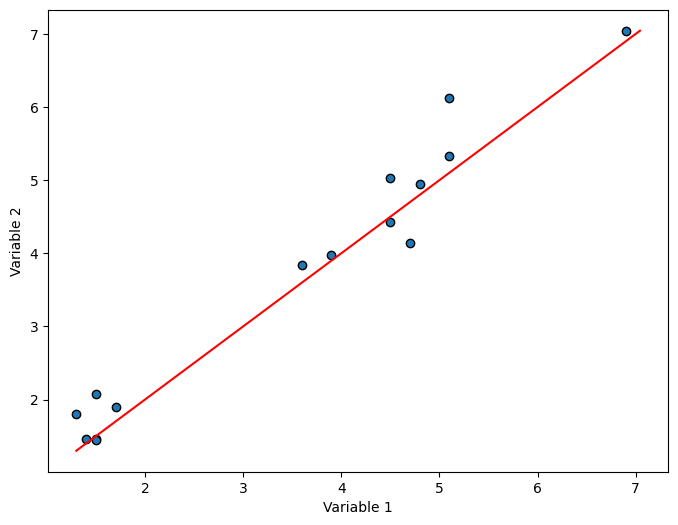

In [20]:
"""
Below, plot and display the correlation between true y and predicted values.
"""
#begin_solution
X_test_b = X_iris_test[:, [0, 1, 3]].astype(float)
y_test_b = X_iris_test[:, 2].astype(float)
Xb_test = np.c_[np.ones((X_test_b.shape[0], 1)), X_test_b]
y_test_pred = Xb_test @ w_line
plot_correlation(y_test_b, y_test_pred)
#end_solution


Do not write anything in the cell below, it is for TAs

In [21]:
#begin_test

#end_test


**Question 1c**
<a name='question1c'></a>

Implement the poly_fit function and test

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [22]:
def poly_fit(X,y):
    """
    Write your implementation of poly_fit here.

    Arguments:
    X : Data matrix
    y : Labels

    Returns:
    w : Weights
    l2_error : L2 prediction error using learned w
    """

    #begin_solution
    X = np.asarray(X, dtype=float)
    y = np.asarray(y, dtype=float).reshape(-1)
    n, d = X.shape

    # 2nd degree polynomial features with order as: [squares..., pairwise..., linear...]
    cols = []


    for i in range(d):
        cols.append((X[:, i] ** 2).reshape(n, 1))

    for i in range(d):
        for j in range(i + 1, d):
            cols.append((X[:, i] * X[:, j]).reshape(n, 1))

    cols.append(X)

    X_poly = np.hstack(cols) if cols else X

    Xb = np.c_[np.ones((n, 1)), X_poly]
    w = nsolve(Xb, y)

    y_pred = Xb @ w
    l2_error = float(np.mean((y - y_pred) ** 2))
    #end_solution


    return w, l2_error

Testing your code on _IRIS_.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [23]:
"""
After implementing poly_fit, test it below on IRIS Training set.
Print L2 error with respect to training set.
"""

#begin_solution
X_train_c = X_iris[:, [0, 1, 2]].astype(float)
y_train_c = X_iris[:, 3].astype(float)

w_poly, l2_train_poly = poly_fit(X_train_c, y_train_c)
print("Train L2 MSE =", l2_train_poly)
#end_solution


Train L2 MSE = 0.030979074414104246


&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [24]:
"""
After implementing poly_fit, test it below on IRIS Test set.
Print L2 error with respect to test set.
"""

#begin_solution
X_test_c = X_iris_test[:, [0, 1, 2]].astype(float)
y_test_c = X_iris_test[:, 3].astype(float)

# building poly features in same order as poly_fit
X_poly_test = np.hstack([
    X_test_c**2,
    np.c_[X_test_c[:,0]*X_test_c[:,1],
          X_test_c[:,0]*X_test_c[:,2],
          X_test_c[:,1]*X_test_c[:,2]],
    X_test_c
])

Xb_test = np.c_[np.ones((X_poly_test.shape[0], 1)), X_poly_test]
y_test_pred = Xb_test @ w_poly
l2_test_poly = float(np.mean((y_test_c - y_test_pred)**2))
print("Test L2 MSE = ", l2_test_poly)
#end_solution

Test L2 MSE =  0.04955733981689645


Showing the correlation between X and y.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

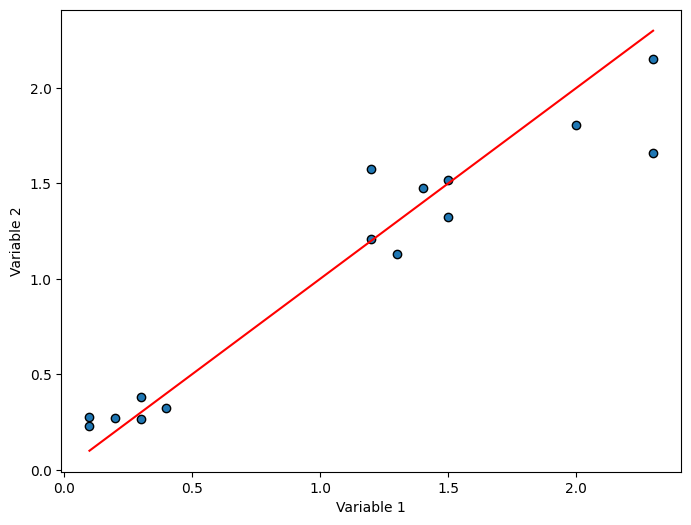

In [25]:
"""
Below, plot and display the correlation between true y and predicted values
"""

#begin_solution
X_test_c = X_iris_test[:, [0, 1, 2]].astype(float)
y_test_c = X_iris_test[:, 3].astype(float)

X_poly_test = np.hstack([
    X_test_c**2,
    np.c_[X_test_c[:,0]*X_test_c[:,1],
          X_test_c[:,0]*X_test_c[:,2],
          X_test_c[:,1]*X_test_c[:,2]],
    X_test_c
])

Xb_test = np.c_[np.ones((X_poly_test.shape[0], 1)), X_poly_test]
y_test_pred = Xb_test @ w_poly

plot_correlation(y_test_c, y_test_pred)
#end_solution



Do not write anything the cell below, it is for TAs

In [26]:
#begin_test

#end_test


## 2. Image retrieval (15 points)
<a name='question2'></a>

Image retrieval means there is a query, and there is a database. Your job is to find the most similar image from the database. What is considered similar depends on the features used.

[a)](#question2a) Implement four different feature spaces: rgb distance, histogram distance, vgg features and vgg features gram matrix. You can only use the torchvision and torch library (**4 points** + **1 points** for your vectorised version (return features by a batch_size instead of for loop))

[b)](#question2b) Implement an algorithm to retrieve the index of the most similar image from the database. we will use a hidden query and hidden DB to test this. make sure your code works with all DB sizes and resolutions. For testing, you are given a single database with N entries and M querys.
(**4 points** + **1 points** for your vectorised version (return features by a batch_size instead of for loop))

The hidden dataset images size are from (64, 64, 3) to (256, 256, 3).

[c)](#question2c) Discuss and document, why each of the M-times-N results is what it is.
(**5 points**)

**Question 2a**



&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [27]:
!pip install gdown
import gdown
from PIL import Image
import numpy as np
from matplotlib import pyplot as plt

output = 'dataset.zip'
gdown.download(id='1udnykJuPVa219EB4X0zSaW9Umi-pGvVm', output=output, quiet=False)

!unzip -qq dataset.zip -d ./dataset

Downloading...
From: https://drive.google.com/uc?id=1udnykJuPVa219EB4X0zSaW9Umi-pGvVm
To: /content/dataset.zip
100%|██████████| 57.0k/57.0k [00:00<00:00, 70.7MB/s]


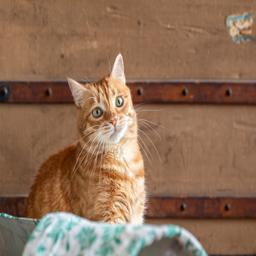

In [28]:
if drive_mount:
  query_img = Image.open('/content/dataset/Image_Retrieval_student_data/query.JPEG')
else:
  query_img = Image.open('./dataset/Image_Retrieval_student_data/query.JPEG')
query_img

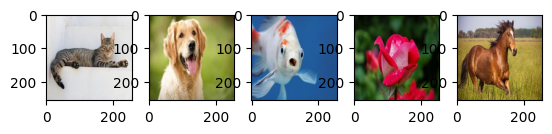

In [29]:
database_imgs_list = []
for i in range(5):
    if drive_mount:
        tmp_img = Image.open(f'/content/dataset/Image_Retrieval_student_data/{i + 1}.JPEG')
    else:
        tmp_img = Image.open(f'./dataset/Image_Retrieval_student_data/{i + 1}.JPEG')
    database_imgs_list.append(tmp_img)

plt.figure()
for i in range(5):
    plt.subplot(1, 5, i + 1)
    plt.imshow(database_imgs_list[i])
plt.show()

In [30]:
vgg = None
# Load the pretrained vgg19 model, we recommend you to use torchvision.models. And you can search to find a pretrained vgg19 model

#begin_solution
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

weights = models.VGG19_Weights.DEFAULT
vgg = models.vgg19(weights=weights).features.to(device).eval()
for p in vgg.parameters():
    p.requires_grad = False

vgg_preprocess = weights.transforms()
#end_solution


Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


100%|██████████| 548M/548M [00:06<00:00, 84.4MB/s]


In [31]:
def get_features(img, mod):
    """
    Get the features of the image

    Arguments:
    img : an image, PIL image; or a list of images, [PIL image, PIL image, ...]
    mod : the model to use to extract features
    mod == 1: return the image
    mod == 2: return the histogram
    mod == 3: return the vgg19 feature
    mod == 4: return the vgg19 feature gram matrix

    Returns:
    features : Features of the image as a numpy array; or a list of features numpy array, [features, features, ...]
    """
    features = None
    #begin_solution
    try:
        trn = transforms  # likely imported in a package cell
    except NameError:
        import torchvision as _tv
        trn = _tv.transforms

    # Normalize flag for batch/single return format
    is_batch = isinstance(img, (list, tuple))
    imgs = img if is_batch else [img]

    # Helpers kept local to stay within this solution block
    def _to_tensor_list(pils):
        # ToTensor converts PIL [0..255] -> float CHW in [0,1]
        t_list = []
        for im in pils:
            t = trn.ToTensor()(im)
            if t.shape[0] == 1:  # grayscale -> 3ch
                t = t.repeat(3, 1, 1)
            t_list.append(t)
        return t_list

    def _stack_resize(pils, size=None):
        t_list = _to_tensor_list(pils)
        if size is not None:
            t_list = [trn.functional.resize(t, size, antialias=True) for t in t_list]
        return torch.stack(t_list, dim=0)  # [B,3,H,W]

    # ---- Mode 1: raw RGB flattened (resize to 224x224 for consistent dims)
    if mod == 1:
        x = _stack_resize(imgs, size=(224, 224))            # [B,3,224,224] on CPU
        feats = x.flatten(1)                                # [B, 3*224*224]
        if is_batch:
            return [feats[i].cpu().numpy() for i in range(feats.shape[0])]
        else:
            return feats[0].cpu().numpy()

    # ---- Mode 2: per-channel histograms (vectorized across the batch)
    elif mod == 2:
        x = _stack_resize(imgs, size=None)                  # keep native size; L1 will normalize
        B, C, H, W = x.shape
        bins = 32
        xf = (x * 255.0).reshape(B, C, -1)                  # [B,3,HW] in [0,255]
        edges = torch.linspace(0, 255, bins + 1, device=xf.device)
        idx = torch.bucketize(xf, edges, right=True).clamp_max(bins) - 1  # [B,3,HW] in [0,bins-1]
        onehot = F.one_hot(idx, num_classes=bins).float()   # [B,3,HW,bins]
        h = onehot.sum(dim=2)                               # [B,3,bins]
        h = h / (H * W)                                     # L1 over pixels
        feats = h.reshape(B, -1)                            # [B, 3*bins]
        if is_batch:
            return [feats[i].cpu().numpy() for i in range(B)]
        else:
            return feats[0].cpu().numpy()

    # ---- Mode 3/4: VGG features or VGG Gram
    elif mod in (3, 4):
        # Prefer provided preprocessing if available; otherwise define locally.
        try:
            prep = vgg_preprocess  # from your earlier cell
            x = torch.stack([prep(im) for im in imgs], dim=0)
        except Exception:
            # Fallback: manual resize+normalize matching ImageNet stats
            x = _stack_resize(imgs, size=(224, 224))
            mean = torch.tensor([0.485, 0.456, 0.406]).view(1, 3, 1, 1)
            std  = torch.tensor([0.229, 0.224, 0.225]).view(1, 3, 1, 1)
            x = (x - mean) / std

        # Run VGG in a single batched forward
        device = next(vgg.parameters()).device
        vgg.eval()
        with torch.no_grad():
            feat = vgg(x.to(device))                        # [B,C,H,W], typically [B,512,7,7]
            if mod == 3:
                vec = F.adaptive_avg_pool2d(feat, (1, 1)).squeeze(-1).squeeze(-1)  # [B,C]
                vec = vec.detach().cpu()
                if is_batch:
                    return [vec[i].numpy() for i in range(vec.shape[0])]
                else:
                    return vec[0].numpy()
            else:
                B, C, H, W = feat.shape
                f = feat.reshape(B, C, H * W)               # [B,C,HW]
                gram = torch.bmm(f, f.transpose(1, 2)) / (C * H * W)  # [B,C,C]
                vec = gram.reshape(B, C * C).detach().cpu()
                if is_batch:
                    return [vec[i].numpy() for i in range(B)]
                else:
                    return vec[0].numpy()

    else:
        raise ValueError(f"Unknown mod: {mod}")
    #end_solution

    return features

In [32]:
def find_img(query_img, database_imgs_list, mod):
    """
    Find the closest image in the database to the query image.

    Arguments:
    query_img: the query image, PIL image
    database_imgs_list : a list of images, [PIL image, PIL image, ...]
    mod : the model to use to extract features
    mod == 1: return the image
    mod == 2: return the image's histogram
    mod == 3: return the vgg19 festure of the image
    mod == 4: return the vgg19 gram feature of the image

    Returns:
    index: the index of the closest image in the database list
    distance_list: the list of distances between the query image and each image in the database list
    """
    index = None
    distance_list = []
    #begin_solution
    f_query = get_features(query_img, mod)              # -> (D,)
    F_db = get_features(database_imgs_list, mod)        # -> list[(D,)] or (N,D)

    # 2) Normalize to numpy arrays of shapes (N,D) and (1,D)
    if isinstance(F_db, list):
        F_db = np.stack([np.asarray(f).reshape(-1) for f in F_db], axis=0)
    else:
        F_db = np.asarray(F_db)
        if F_db.ndim == 1:
            F_db = F_db[None, :]
        else:
            F_db = F_db.reshape(F_db.shape[0], -1)

    f_query = np.asarray(f_query).reshape(1, -1)

    # 3) Vectorized L2 distances
    diff = F_db - f_query
    distances = np.sqrt(np.sum(diff * diff, axis=1))    # (N,)

    # 4) Argmin and output
    index = int(np.argmin(distances))
    distance_list = distances.tolist()
    #end_solution

    return index, distance_list

Test your results

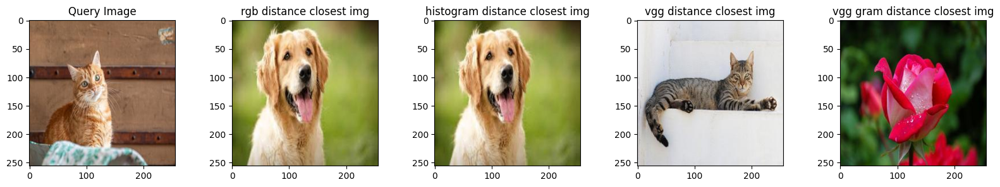

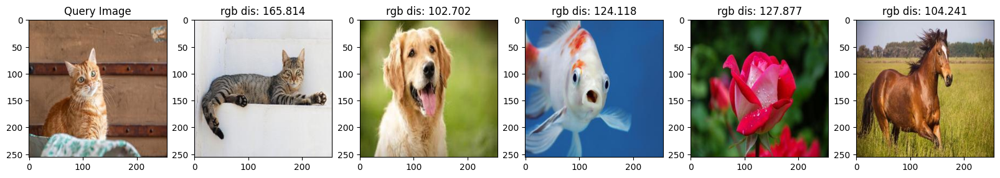

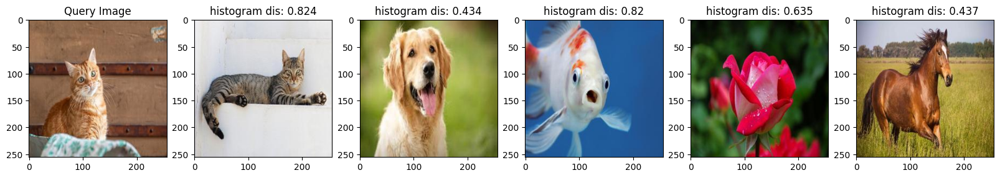

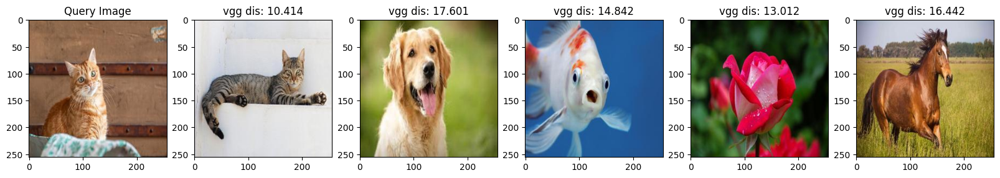

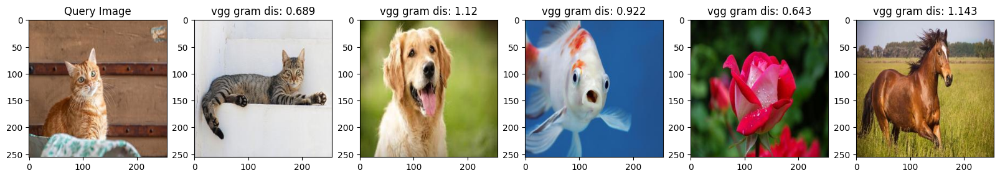

In [33]:
def test_retrieval(query_img, database_imgs_list):
    rgb_distance = [0, 0, 0, 0, 0]
    histogram_distance = [0, 0, 0, 0, 0]
    vgg_distance = [0, 0, 0, 0, 0]
    vgg_gram_distance = [0, 0, 0, 0, 0]

    # you can use the function you implemented above to get the distance to visualize the results
    # nothing here for grade, just for you to debug & visualize
    # ----
    res_rgb, rgb_distance = find_img(query_img, database_imgs_list, mod = 1)
    res_his, histogram_distance = find_img(query_img, database_imgs_list, mod = 2)
    res_vgg, vgg_distance = find_img(query_img, database_imgs_list, mod = 3)
    res_vgg_gram, vgg_gram_distance = find_img(query_img, database_imgs_list, mod = 4)
    # ----

    plt.figure(figsize=(20, 3))
    plt.subplot(1, 5, 1)
    plt.imshow(query_img)
    plt.title('Query Image')
    plt.subplot(1, 5, 2)
    plt.imshow(database_imgs_list[res_rgb])
    plt.title('rgb distance closest img')
    plt.subplot(1, 5, 3)
    plt.imshow(database_imgs_list[res_his])
    plt.title('histogram distance closest img')
    plt.subplot(1, 5, 4)
    plt.imshow(database_imgs_list[res_vgg])
    plt.title('vgg distance closest img')
    plt.subplot(1, 5, 5)
    plt.imshow(database_imgs_list[res_vgg_gram])
    plt.title('vgg gram distance closest img')
    plt.show()


    plt.figure(figsize=(20, 3))
    plt.subplot(1, 6, 1)
    plt.imshow(query_img)
    plt.title('Query Image')
    for i in range(5):
        plt.subplot(1, 6, i + 2)
        plt.imshow(database_imgs_list[i])
        plt.title(f'rgb dis: ' + str(round(rgb_distance[i], 3)))
    plt.show()

    plt.figure(figsize=(20, 3))
    plt.subplot(1, 6, 1)
    plt.imshow(query_img)
    plt.title('Query Image')
    for i in range(5):
        plt.subplot(1, 6, i + 2)
        plt.imshow(database_imgs_list[i])
        plt.title(f'histogram dis: ' + str(round(histogram_distance[i], 3)))
    plt.show()


    plt.figure(figsize=(20, 3))
    plt.subplot(1, 6, 1)
    plt.imshow(query_img)
    plt.title('Query Image')
    for i in range(5):
        plt.subplot(1, 6, i + 2)
        plt.imshow(database_imgs_list[i])
        plt.title(f'vgg dis: ' + str(round(vgg_distance[i], 3)))
    plt.show()

    plt.figure(figsize=(20, 3))
    plt.subplot(1, 6, 1)
    plt.imshow(query_img)
    plt.title('Query Image')
    for i in range(5):
        plt.subplot(1, 6, i + 2)
        plt.imshow(database_imgs_list[i])
        plt.title(f'vgg gram dis: ' + str(round(vgg_gram_distance[i], 3)))
    plt.show()

test_retrieval(query_img, database_imgs_list)

Do not write anything in the cell below, it is for the TAs

In [34]:
#begin_test

#end_test


**Question 2b**

Choose you methodology which will be tested on a hidden dataset

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>


In [35]:
def get_features_q2b(img):
    """
    Get the features of the image

    Arguments:
    img : an image, PIL image; or a list of images, [PIL image, PIL image, ...]

    Returns:
    features : Features of the image as a numpy array; or a list of features numpy array, [features, features, ...]
    """
    features = None
    #begin_solution
    def _to_rgb01_array(im):
        a = np.asarray(im)
        if a.ndim == 2:                       # grayscale -> RGB
            a = np.stack([a, a, a], axis=-1)
        if a.shape[-1] == 4:                  # RGBA -> RGB
            a = a[..., :3]
        a = a.astype(np.float32, copy=False)
        if a.max() > 1.0:
            a /= 255.0
        return a  # [H,W,3] in [0,1]

    def _cell_hist(rgb_cell, bins=32):
        Hc = []
        for c in range(3):
            ch = rgb_cell[..., c].ravel()
            idx = np.floor(ch * bins).astype(np.int32)
            idx = np.clip(idx, 0, bins - 1)
            h = np.bincount(idx, minlength=bins).astype(np.float32, copy=False)
            s = h.sum()
            if s > 0:
                h /= s  # L1 per channel
            Hc.append(h)
        return np.concatenate(Hc, axis=0)  # [3*bins]

    def _pyramid_hist(rgb, levels=((1,1),(2,2)), bins=32):
        H, W, _ = rgb.shape
        parts = []
        for ny, nx in levels:
            y_edges = np.linspace(0, H, ny + 1, dtype=np.int32)
            x_edges = np.linspace(0, W, nx + 1, dtype=np.int32)
            for iy in range(ny):
                y0, y1 = y_edges[iy], y_edges[iy + 1]
                for ix in range(nx):
                    x0, x1 = x_edges[ix], x_edges[ix + 1]
                    parts.append(_cell_hist(rgb[y0:y1, x0:x1, :], bins))
        f = np.concatenate(parts, axis=0).astype(np.float32, copy=False)  # 480-D
        nrm = np.sqrt(np.sum(f * f, dtype=np.float32)) + 1e-8             # L2 norm
        f /= nrm
        return f

    is_batch = isinstance(img, (list, tuple))
    imgs = list(img) if is_batch else [img]

    feats = []
    for im in imgs:
        rgb = _to_rgb01_array(im)
        f = _pyramid_hist(rgb, levels=((1,1),(2,2)), bins=32)
        feats.append(f)

    feats = np.stack(feats, axis=0).astype(np.float32, copy=False)
    features = feats if is_batch else feats[0]

    #end_solution

    return features

In [36]:
def find_img_q2b(query_img, database_imgs_list):
    """
    Find the closest image in the database to the query image.

    Arguments:
    query_img: the query image, PIL image
    database_imgs_list : a list of images, [PIL image, PIL image, ...]

    Returns:
    index: the index of the closest image in the database list
    distance_list: the list of distances between the query image and each image in the database list
    """
    index = None
    distance_list = []
    #begin_solution
    if len(database_imgs_list) == 0:
        raise ValueError("database_imgs_list is empty.")

    # Precompute normalized DB features once
    F_db = get_features_q2b(database_imgs_list)   # (N, D)

    # Multi-query (M) vs single-query
    if isinstance(query_img, (list, tuple)):
        F_q = get_features_q2b(query_img)         # (M, D)
        # Cosine distances (features are L2-normalized): 1 - q·d
        D = 1.0 - (F_q @ F_db.T)                  # (M, N)
        # Numerical guard
        D = np.clip(D.astype(np.float32, copy=False), 0.0, 2.0)
        indices = np.argmin(D, axis=1).astype(int).tolist()
        distance_list = D.tolist()
        return indices, distance_list
    else:
        f_q = get_features_q2b(query_img)         # (D,)
        dist = 1.0 - (F_db @ f_q)                 # (N,)
        dist = np.clip(dist.astype(np.float32, copy=False), 0.0, 2.0)
        index = int(np.argmin(dist))
        distance_list = dist.tolist()
    #end_solution

    return index, distance_list

Do not write anything in the cell below, it is for the TAs

In [37]:
#begin_test

#end_test


**Question 2c**



```
# This is formatted as code
```

_Your reply here:_

Here, each method produces an
$M \times N$
distance matrix
$D$
 where row
$i$
corresponds to a query image and column
$𝑗$
to a database image; the entry
$D_{ij}$ is the distance between those two under that feature space. As a reminder, we can only compare distances within the same method, as the scale changes according to feature types. Visually, a dark band down a column means many queries resemble that database image under that specific method and a dark band across a row means the query looks generic to that method.

$--------------------------$

With raw RGB (L2 on resized pixels), distances are small when colour and alignment match closely after resizing, and they grow quickly with small translations or rotations. This means the matrix highlights near-duplicates.

With RGB histograms, distances reflect global colour composition, ignoring spatial layout. Images with similar palettes are close (even if actual content differs) so different scenes with the same colours can look similar. Similarly, differing palettes push distances up.

With VGG features (pooled), distances reflect higher-level content/shape and are pretty robust to spatial changes. Small entries indicate similar objects, and backgrounds matter less.

With the VGG Gram matrix, distances are reflected by texture style (second-order feature correlations). Images with similar textures can be close despite having different objects. Thus, it disagrees with pooled VGG, since Gram is based on shared texture, while pooled VGG is based on shared object (shape).


## 3. Denoising (30 points)
<a name='question3'></a>

[a)](#question4a) Implement `denoiseGauss(image)` to denoise the image `noisy_image.png` under `cw_datasets/Filtering/` using a
5×5 Gaussian filter. (**5 points**)

[b)](#question4b) Implement a convolutional neural network in Pytorch to denoise an image. We provide you pairs of noisy and
noise-free image patches of size 128×128 for training and testing, under `cw_datasets/Denoising/`. You may use all the infrastructure of `Pytorch`. The network should have sufficient depth and complexity to be able to converge well.  Please use ReLU non-linearities after each layer (**20 points**).

[c)](#question4c) Given the comparison between the Gaussian-kernel denoising and the neural network denoising
methods, discuss which method performs better and why. You should write no more than 5 sentences. (**5 points**)


**Question 3a**
<a name='question3a'></a>

Implement the below functions to denoise the image

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [38]:
def gkern(l=5, sig=1.):

    #begin_solution

    assert l % 2 == 1, "Kernel size l must be odd."
    ax = np.arange(l) - (l // 2)
    xx, yy = np.meshgrid(ax, ax, indexing='xy')
    kernel = np.exp(-(xx**2 + yy**2) / (2.0 * sig**2))
    kernel /= kernel.sum() + 1e-12
    out_kernel = kernel.astype(np.float32)


    #end_solution


    return out_kernel

def denoise_gauss(image):

    #begin_solution

    k = gkern(5, 1.0)  # 5x5 Gaussian
    pad = k.shape[0] // 2

    img = np.asarray(image)
    in_dtype = img.dtype

    # Ensure (H,W,C) for unified processing
    if img.ndim == 2:
        img = img[..., None]
    H, W, C = img.shape

    # Work in float32
    imgf = img.astype(np.float32)

    # Reflect-pad spatial dims
    padded = np.pad(imgf, ((pad, pad), (pad, pad), (0, 0)), mode='reflect')

    # Convolution (naive but fine for 64–256 px and 5x5 kernel)
    den = np.zeros_like(imgf)
    for dy in range(-pad, pad + 1):
        for dx in range(-pad, pad + 1):
            w = k[dy + pad, dx + pad]
            den += w * padded[pad + dy:pad + dy + H, pad + dx:pad + dx + W, :]

    # Restore original shape/dtype
    den = den.squeeze(axis=2) if den.shape[2] == 1 else den
    if np.issubdtype(in_dtype, np.integer):
        den = np.clip(den, 0, 255).astype(in_dtype)
    else:
        den = den.astype(in_dtype)

    denoised_image = den

    #end_solution


    return denoised_image

Load input image from file

In [39]:
if drive_mount:
  dataset_path = "/content/drive/MyDrive/cw_datasets/"
else:
  dataset_path = "./cw_datasets/"

noisy_image_filename = os.path.join(dataset_path,"Filtering/noisy_image.png")

Filter the input image

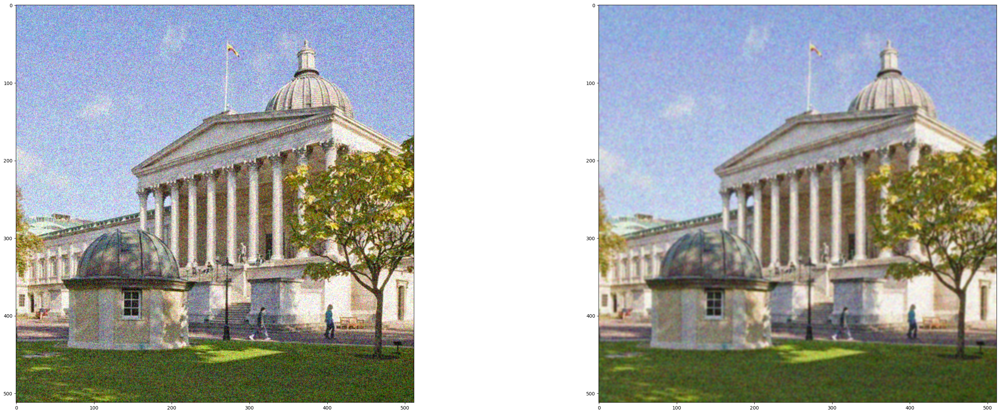

In [40]:
noisy_image = np.asarray(Image.open(noisy_image_filename).convert('RGB'))
denoised_image = denoise_gauss(noisy_image)
plot_images_horizontal([noisy_image, denoised_image])

**Question 3b**
<a name='question3b'></a>

Implement a neural denoiser using Pytorch

Implement dataset class below. Note that the images output by the `DenoisingDB` dataset should be of size 128 x 128. Crop the original images at the top left corner to get the aforementioned size.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [41]:
class DenoisingDB(Dataset):

    def __init__(self, input_imgs_path, cleaned_imgs_path):
        super().__init__()

        #begin_solution
        ext = (".png", ".jpg", ".jpeg", ".bmp", ".tif", ".tiff")

        self.noisy_files = sorted(
            [os.path.join(input_imgs_path, f) for f in os.listdir(input_imgs_path) if f.lower().endswith(ext)]
        )
        self.clean_files = sorted(
            [os.path.join(cleaned_imgs_path, f) for f in os.listdir(cleaned_imgs_path) if f.lower().endswith(ext)]
        )

        assert len(self.noisy_files) == len(self.clean_files) and len(self.noisy_files) > 0, \
            "Noisy and clean folders must have the same, non-zero number of images."

        self.crop_h = self.crop_w = 128
        #end_solution


    def __len__(self):
        #begin_solution
        length = len(self.noisy_files)
        #end_solution

        return length

    def __getitem__(self, idx):

        #begin_solution
        noisy = Image.open(self.noisy_files[idx]).convert("RGB")
        clean = Image.open(self.clean_files[idx]).convert("RGB")

        # Crop top-left corner to 128x128 as required
        noisy = transforms.functional.crop(noisy, top=0, left=0, height=self.crop_h, width=self.crop_w)
        clean = transforms.functional.crop(clean, top=0, left=0, height=self.crop_h, width=self.crop_w)

        # To tensor in [0,1], shape (C,H,W), dtype float32
        input_img = transforms.ToTensor()(noisy)
        cleaned_img = transforms.ToTensor()(clean)
        #end_solution


        return (input_img, cleaned_img)


Implement the Denoising network:

Note that the network need to be sufficiently complex for performing the denoising task successfully. Feel free to experiment with different layers, blocks and operations.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [106]:
class DenoisingCNN(nn.Module):
    def __init__(self):
        super(DenoisingCNN, self).__init__()

        #begin_solution
        depth = 12
        width = 64

        layers = []
        layers += [
            nn.Conv2d(3, width, kernel_size=3, padding=1, padding_mode='reflect', bias=True),
            nn.ReLU(inplace=True)
        ]
        for _ in range(depth - 2):
            layers += [
                nn.Conv2d(width, width, kernel_size=3, padding=1, padding_mode='reflect', bias=False),
                nn.BatchNorm2d(width),   # optionally: nn.GroupNorm(8, width)
                nn.ReLU(inplace=True)
            ]
        layers += [nn.Conv2d(width, 3, kernel_size=3, padding=1, padding_mode='reflect', bias=True)]
        self.net = nn.Sequential(*layers)

        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, nonlinearity="relu")
                if m.bias is not None:
                    nn.init.zeros_(m.bias)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.ones_(m.weight); nn.init.zeros_(m.bias)
        #end_solution

    def forward(self, x):
        #begin_solution
        noise = self.net(x)
        # overwrite x with the denoised image so the outer `return x` returns the result
        x = x - noise
        # (optional) clamp only at inference time
        if not self.training:
            x = x.clamp(0, 1)      # denoised image

        #end_solution


        return x

# Create an instance of the network
model = DenoisingCNN()


Implement the reconstruction loss

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [107]:
def loss_function(prediction, target):
    """
    Calculate the Mean Squared Error (MSE) loss between the prediction and the target.

    Arguments:
    prediction : torch.Tensor
        The predicted image.
    target : torch.Tensor
        The target image for reconstruction.

    Returns:
    loss : torch.Tensor
        The computed loss.
    """

    #begin_solution
    loss = F.mse_loss(prediction, target, reduction='mean')
    #end_solution


    return loss


 Paths to input data






In [44]:
if drive_mount:
  dataset_path = "/content/drive/MyDrive/cw_datasets/"
else:
  dataset_path = "./cw_datasets/"

input_imgs_path = os.path.join(dataset_path,"Denoising/input_noisy_images/")
cleaned_imgs_path = os.path.join(dataset_path,"Denoising/target_clean_images/")

Write the training loop

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [111]:
#begin_solution
ds = DenoisingDB(input_imgs_path, cleaned_imgs_path)
val_frac = 0.2
n_total = len(ds)
n_val = max(1, int(n_total * val_frac))
n_train = n_total - n_val
gen = torch.Generator().manual_seed(RAND_ST if 'RAND_ST' in locals() else 42)

train_ds, val_ds = torch.utils.data.random_split(ds, [n_train, n_val], generator=gen)

BATCH_SIZE = 16
train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,  num_workers=2, pin_memory=True)
val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

# ---- Model / Optimizer ----
device = device if 'device' in locals() else torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
optimizer = optim.Adam(model.parameters(), lr=1e-3)

# ---- Training loop ----
EPOCHS = 10  # adjust if you want to train longer
train_losses, val_losses = [], []
best_val, best_epoch = float('inf'), -1

# ensure models/ exists for saving weights (required by coursework)
models_dir = Path("models")
models_dir.mkdir(exist_ok=True)

for epoch in range(1, EPOCHS + 1):
    # Train
    model.train()
    running = 0.0
    for noisy, clean in train_loader:
        noisy = noisy.to(device, non_blocking=True)
        clean = clean.to(device, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)
        denoised = model(noisy)
        loss = loss_function(denoised, clean)
        loss.backward()
        optimizer.step()

        running += loss.item() * noisy.size(0)

    train_loss = running / n_train
    train_losses.append(train_loss)

    # Validate
    model.eval()
    running = 0.0
    with torch.no_grad():
        for noisy, clean in val_loader:
            noisy = noisy.to(device, non_blocking=True)
            clean = clean.to(device, non_blocking=True)
            denoised = model(noisy)
            loss = loss_function(denoised, clean)
            running += loss.item() * noisy.size(0)

    val_loss = running / n_val
    val_losses.append(val_loss)

    # Save checkpoints
    last_path = models_dir / "denoising_cnn_last.pth"
    torch.save(model.state_dict(), last_path)

    if val_loss < best_val:
        best_val, best_epoch = val_loss, epoch
        best_path = models_dir / "denoising_cnn_best.pth"
        torch.save(model.state_dict(), best_path)

    print(f"Epoch {epoch:02d}/{EPOCHS} - train: {train_loss:.6f}, val: {val_loss:.6f}")
    denoiser = model
if isinstance(denoiser, torch.nn.DataParallel):
    denoiser = denoiser.module
denoiser = denoiser.to('cpu').eval()

#end_solution

Epoch 01/10 - train: 0.038675, val: 0.014277
Epoch 02/10 - train: 0.016419, val: 0.016112
Epoch 03/10 - train: 0.008453, val: 0.016986
Epoch 04/10 - train: 0.005419, val: 0.015497
Epoch 05/10 - train: 0.003952, val: 0.004046
Epoch 06/10 - train: 0.003190, val: 0.004906
Epoch 07/10 - train: 0.002759, val: 0.002175
Epoch 08/10 - train: 0.002512, val: 0.002225
Epoch 09/10 - train: 0.002440, val: 0.001768
Epoch 10/10 - train: 0.002117, val: 0.001578


Save the model (needed for marking)

In [112]:
if not os.path.exists("models/"):
  os.makedirs("./models/")
torch.save({"denoiser":denoiser}, "models/denoiser.pth")

Load trained model

In [113]:
state_dict = torch.load("models/denoiser.pth", weights_only=False)
denoiser = state_dict["denoiser"].to(device)

Plot 5 input images and their relative denoised images side by side. Populate the 3 lists of input, gt and output with 5 images each.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

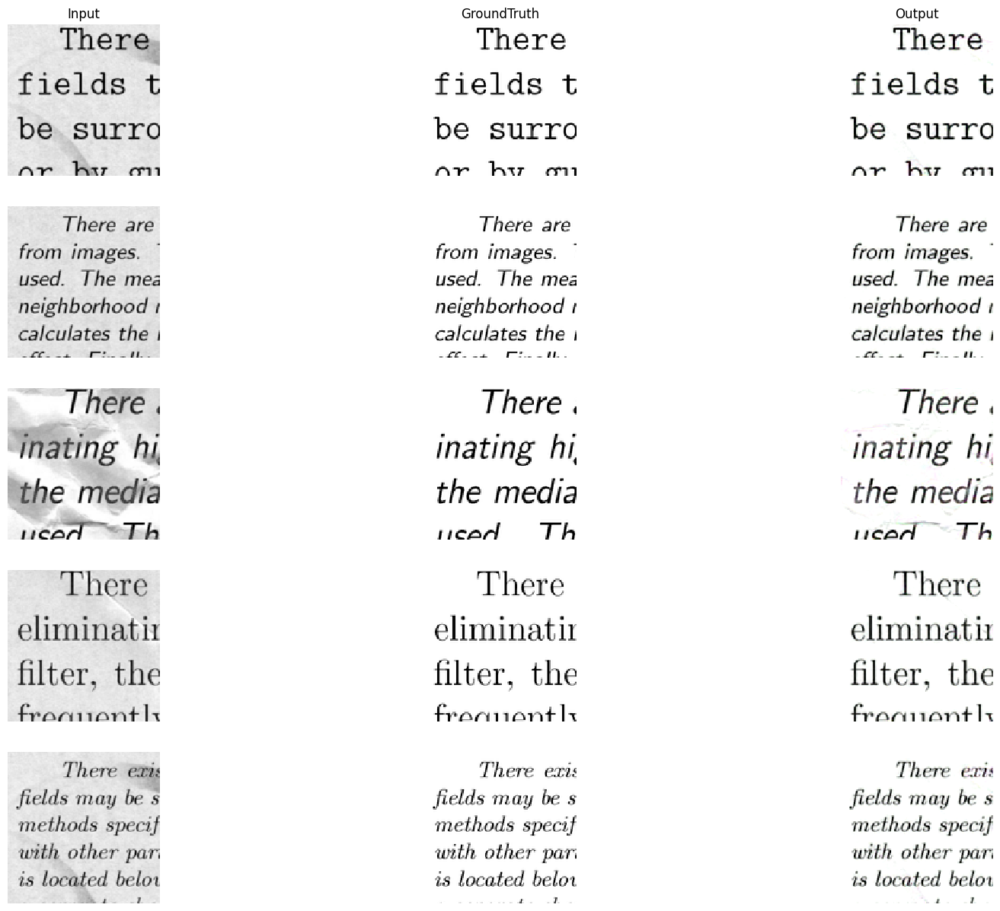

In [115]:
input_imgs, gt_imgs, output_imgs = [], [], []

#begin_solution

device = device if 'device' in locals() else torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device).eval()

with torch.no_grad():
    for noisy, clean in val_loader:
        noisy_dev = noisy.to(device)
        pred = model(noisy_dev).clamp(0, 1).cpu()

        # move tensors to CPU for plotting
        noisy_cpu = noisy.cpu()
        clean_cpu = clean.cpu()

        for i in range(noisy_cpu.size(0)):
            if len(input_imgs) >= 5:
                break
            input_imgs.append(noisy_cpu[i].permute(1, 2, 0).numpy())   # (H,W,3) in [0,1]
            gt_imgs.append(clean_cpu[i].permute(1, 2, 0).numpy())       # (H,W,3) in [0,1]
            output_imgs.append(pred[i].permute(1, 2, 0).numpy())        # (H,W,3) in [0,1]
        if len(input_imgs) >= 5:
            break

#end_solution


titles = ['Input', 'GroundTruth', 'Output']
plot_images_with_text([input_imgs, gt_imgs, output_imgs],titles,texts=None)


Compute images for both the AE and Gaussian Kernels algorithm from `images`.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [132]:
dataset = DenoisingDB(input_imgs_path,cleaned_imgs_path)

images = [dataset[i][0].to(device) for i in range(5)]
targets = [dataset[i][1].to(device) for i in range(5)]
images_ae = []
images_gauss = []

#begin_solution
model = model.to(device).eval()
with torch.no_grad():
    inp_batch = torch.stack(images, dim=0)          # (5, 3, 128, 128) on device
    out_batch = model(inp_batch).clamp(0, 1)        # (5, 3, 128, 128)

# AE outputs -> HWC float32 NumPy (for PSNR + plotting)
images_ae = [
    out_batch[i].detach().cpu().permute(1, 2, 0).numpy().astype(np.float32, copy=False)
    for i in range(out_batch.size(0))
]

# Gaussian outputs -> HWC float32 NumPy
images_gauss = []
for im in images:
    im_np = im.detach().cpu().permute(1, 2, 0).numpy().astype(np.float32, copy=False)  # HWC
    den_np = denoise_gauss(im_np)                                                      # HWC in [0,1]
    images_gauss.append(den_np.astype(np.float32, copy=False))

# IMPORTANT: reassign images/targets to HWC torch tensors so the NEXT (fixed) cell
# creates HWC NumPy arrays via .detach().cpu().numpy()
images  = [el.detach().cpu().permute(1, 2, 0) for el in images]   # HWC torch.Tensors
targets = [el.detach().cpu().permute(1, 2, 0) for el in targets]  # HWC torch.Tensors


#end_solution


Now we plot images and PSNR, to compare the two methods

In [133]:
imgs_plot = [ el.detach().squeeze().cpu().numpy() for el in images]
tgts_plot = [ el.detach().squeeze().cpu().numpy() for el in targets]

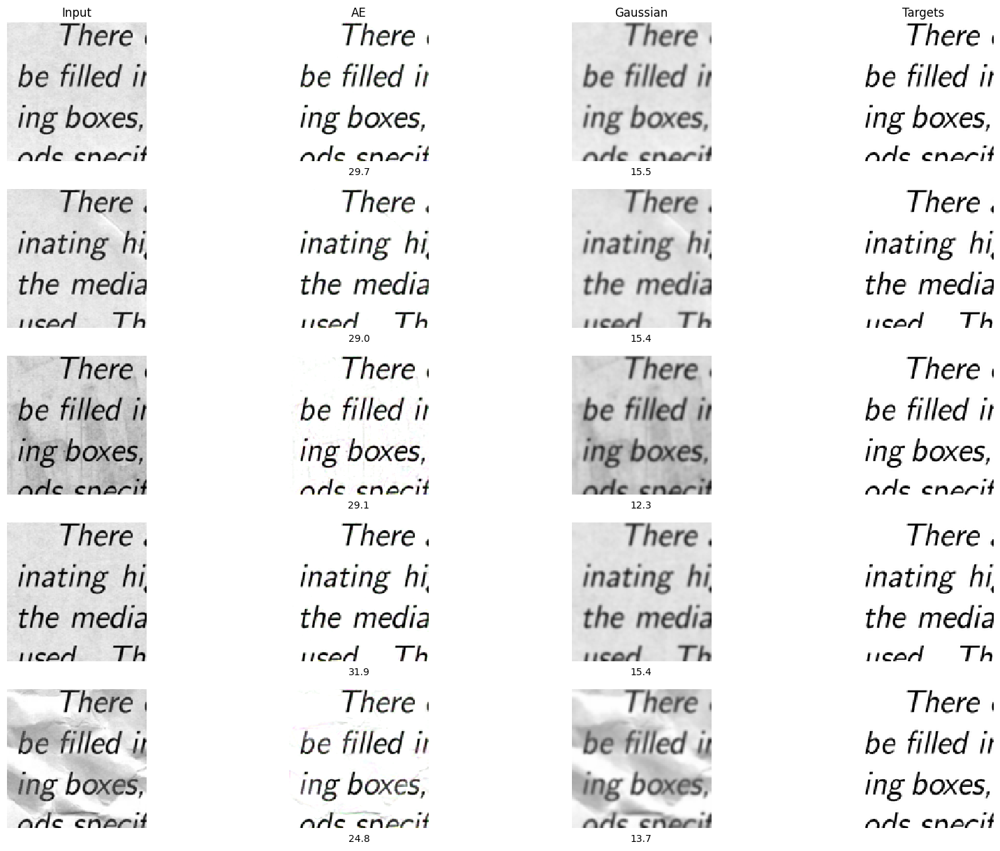

In [134]:
psnrs = [ 0.0 for el in targets ]
for i in range(len(tgts_plot)):
    psnr_ae    = peak_signal_noise_ratio(tgts_plot[i], images_ae[i])
    pnsr_gauss = peak_signal_noise_ratio(tgts_plot[i], images_gauss[i])
    psnrs[i] = ['', psnr_ae, pnsr_gauss, '']

img = [imgs_plot, images_ae, images_gauss, tgts_plot]
titles = ['Input', 'AE', 'Gaussian', 'Targets']
texts = psnrs
plot_images_with_text(img, titles, texts)
plt.show()

**Question 3c**
<a name="question3c"></a>

#### Discuss which method performs better, and why, edit the cell below with "Your reply" ####



_Your reply here:_

Overall the CNN denoiser performs better since in the patches it achieves around 30 dB PSNR versus around 15 dB for the 5×5 Gaussian

This is despite the CNN model being more computationally expensive, it clearly outperforms Gaussian smoothing

I believe this is because the CNN learns a data prior from pairs of images (from both noisy and clean) making it spatially adaptive, so it reduces noise while preserving sharp edges and thin text strokes. On the other hand, the Gaussian filter is a fixed, shift-invariant smoother, so it reduces high-frequency noise but by doing so blurs details and cannot reliably model noise.

## 4. Texture Synthesis (15 points)
We ask you to perform operations on image styles for this task.

You know that style is captured in the statistics of visual features. We want you to extract different statistics and apply that to texture synthesis. Texture synthesis are images with no content, only style.

[a)](#question4a) Write code to extract means, variance and gram matrices of the style from an exemplar image. We will test this with hidden styles/textures. **(3 points)**

[b)](#question4b) Generate a texture by optimizing image pixels for a given statistics. We will test this with our hidden texture as well. **(6 points)**

[c)](#question4c) How can you improve the starting input to get more visually appealing results. **(1 points )**

[d)](#question4d) Find us a non-trivial texture that looks acceptable in mean, but not in other. **(1 points )**

[e)](#question4e) Find us a non-trivial texture that looks acceptable only in gram. **(1 points )**

[f)](#question4f) Failure case. We give you an exemplar with regular patterns. It fails. Can you fix it? perform your own research and explain. **(2 points )**

[g)](#question4f) How can you use the answer of this section to generate a good hidden test image for Question 2. Write no more than one sentence. **(1 points )**

In [52]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
cnn = models.vgg19(weights=models.VGG19_Weights.DEFAULT).features.to(device).eval()
cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225]).to(device)
unloader = transforms.ToPILImage()

def load_image(image_path, transform):
    image = Image.open(image_path).convert("RGB")
    image = transform(image).unsqueeze(0)
    return image.to(device)

def unload_image(tensor, title=None):
    image = tensor.cpu().clone().squeeze(0)
    image = unloader(image)
    return image

**Question 4a**
<a name='question4a'></a>

Write code to extract means, variance and gram matrices of the style layers from an example image. We will test this with hidden styles/textures.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [53]:
def get_vgg_gram_matrix(input):
    #begin_solution
    x = input
    if x.dim() == 3:  # (C, H, W)
        C, H, W = x.shape
        F = x.reshape(C, H * W)           # (C, HW)
        G = F @ F.t()                     # (C, C)
        G = G / (C * H * W)               # normalize
        return G
    elif x.dim() == 4:  # (N, C, H, W)
        N, C, H, W = x.shape
        F = x.reshape(N, C, H * W)        # (N, C, HW)
        G = torch.matmul(F, F.transpose(1, 2))  # (N, C, C)
        G = G / (C * H * W)
        return G
    else:
        raise ValueError("Expected (C,H,W) or (N,C,H,W) tensor for Gram matrix.")

    #end_solution



def get_vgg_mean(input):
    #begin_solution
    x = input
    if x.dim() == 3:                      # (C,H,W) -> (C,1,1)
        return x.mean(dim=(1, 2), keepdim=True)
    elif x.dim() == 4:                    # (N,C,H,W) -> (N,C,1,1)
        return x.mean(dim=(2, 3), keepdim=True)
    else:
        raise ValueError("Expected (C,H,W) or (N,C,H,W) tensor for mean.")

    #end_solution



def get_vgg_var(input):
    #begin_solution
    x = input
    if x.dim() == 3:                      # (C,H,W) -> (C,1,1)
        return x.var(dim=(1, 2), unbiased=False, keepdim=True)
    elif x.dim() == 4:                    # (N,C,H,W) -> (N,C,1,1)
        return x.var(dim=(2, 3), unbiased=False, keepdim=True)
    else:
        raise ValueError("Expected (C,H,W) or (N,C,H,W) tensor for variance.")

    #end_solution



class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()

        #begin_solution
        self.register_buffer('mean', mean.view(-1, 1, 1))  # (C,1,1)
        self.register_buffer('std',  std.view(-1, 1, 1))   # (C,1,1)
        #end_solution


    def forward(self, img):
        # Return the normalized image based on VGG19 mean and variance
        #begin_solution
        return (img - self.mean) / self.std
        #end_solution



class StyleFeaturesExtractor:
    def __init__(self, cnn, style_img, normalization_mean, normalization_std, num_layers=10):
        """
        A class to extract style features from a pre-trained VGG19

        Attributes:
        -----------
        cnn : torch.nn.Module -- pre-trained VGG19

        style_img : torch.Tensor

        normalization_mean : torch.Tensor
            The mean tensor for normalizing the input image.

        normalization_std : torch.Tensor
            The standard deviation tensor for normalizing the input image.

        num_layers : int, optional
            The number of convolutional layers from which style features will be extracted.
            Default is 10.

        model : torch.nn.Sequential
            The model built up to the specified number of layers, including normalization.
            This model will be used for extracting features.

        style_features : dict
            A dictionary to store the extracted style features from different VGG layers.
        """

        self.cnn = cnn
        self.style_img = style_img
        self.normalization_mean = normalization_mean
        self.normalization_std = normalization_std
        self.num_layers = num_layers
        self.model = None
        self.style_features = {}
        self.build_model_and_extract_features()

    def build_model_and_extract_features(self):
        """
        Write your implementation here.

        You have to compute the following.

        1. style_features: a dictionary with the layer indices as keys (int) and the values being another dictionary.
            The nested part of the dictionary has the following structure:
            {
                'gram': torch.Tensor stores the gram matrix of the layer features,
                'mean': torch.Tensor stores the mean of the layer features along 3rd and 4th dimension (keep all dimensions of the original, do not squeeze/shrink),
                'var': torch.Tensor stores the variance of the layer features along 3rd and 4th dimension (keep all dimensions of the original, do not squeeze/shrink)
            }
            Eg: {0: {'gram': torch.Tensor, 'mean': torch.Tensor, 'var': torch.Tensor}, 1: {'gram': torch.Tensor, 'mean': torch.Tensor, 'var': torch.Tensor}, ... 10: {'gram': torch.Tensor, 'mean': torch.Tensor, 'var': torch.Tensor}}

        2. Build the model upto self.num_layers of VGG19 (this will be a partial version of VGG 19 as we do not want to extract features from all layers).
        """

        normalization = Normalization(self.normalization_mean, self.normalization_std).to(device)
        model = nn.Sequential()
        model.add_module(str(-1), normalization)
        style_features = {}

        #begin_solution
        # We'll iteratively build the partial model (normalization + first K conv layers)
        # and, along the way, forward the style image to collect features.

        # start from the normalized image
        with torch.no_grad():
            x = self.style_img
            x = normalization(x)  # apply the normalization once (model contains it, too)

            conv_seen = 0
            add_idx = 0

            for layer in self.cnn.children():
                # ensure non-inplace ReLU for safety
                if isinstance(layer, nn.ReLU):
                    layer = nn.ReLU(inplace=False)

                # add layer to the partial model
                model.add_module(str(add_idx), layer)
                add_idx += 1

                # forward pass
                x = layer(x)

                # record stats at conv layers
                if isinstance(layer, nn.Conv2d):
                    N, C, H, W = x.shape

                    # Gram matrix normalized by C*H*W
                    F = x.reshape(N, C, H * W)                 # (N, C, HW)
                    gram = torch.matmul(F, F.transpose(1, 2))  # (N, C, C)
                    gram = gram / (C * H * W)

                    mean = x.mean(dim=(2, 3), keepdim=True)    # (N, C, 1, 1)
                    var  = x.var(dim=(2, 3), unbiased=False, keepdim=True)  # (N, C, 1, 1)

                    style_features[conv_seen] = {
                        'gram': gram,
                        'mean': mean,
                        'var' : var
                    }

                    conv_seen += 1
                    if conv_seen >= self.num_layers:
                        break

        # finalize
        model.eval()

        #end_solution


        self.model = model
        self.style_features = style_features

Do not write anything the cell below, it is for TAs

In [54]:
#begin_test

#end_test


**Question 4b**
<a name='question4b'></a>

Implement code to generate a texture by optimizing image pixels for a given statistics. We will test this with our hidden texture, too.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [55]:
class StyleLoss(nn.Module):
    def __init__(self, target_feature, loss_method="gram"):
        super(StyleLoss, self).__init__()
        self.loss_method = loss_method
        self.loss = 0

        if self.loss_method == "gram":
            self.target = target_feature['gram'].detach()
        elif self.loss_method == "mean_var":
            self.target_mean = target_feature['mean'].detach()
            self.target_var = target_feature['var'].detach()
        else:
            raise ValueError("Invalid loss_method. Choose 'gram' or 'mean_var'.")

    def forward(self, input):
        # Depending on self.loss_method (either "gram" or "mean_var") compute the loss of input features statistics to that of the target
        # Store the computed loss in self.loss
        # Do NOT change input. Simply use it to compute stats and the loss accordingly.

        # self.loss = ?



        #begin_solution
        if self.loss_method == "gram":
            G = get_vgg_gram_matrix(input)                 # (N, C, C)
            self.loss = F.mse_loss(G, self.target)

        elif self.loss_method == "mean_var":
            # Compute spatial stats with dimensions kept to match targets
            mu  = input.mean(dim=(2, 3), keepdim=True)     # (N, C, 1, 1)
            var = input.var(dim=(2, 3), unbiased=False, keepdim=True)

            # Safety: catch wrong layer wiring early
            if hasattr(self, "target_mean"):
                assert mu.size(1) == self.target_mean.size(1), \
                    f"Channel mismatch: input C={mu.size(1)} vs target C={self.target_mean.size(1)}"

            self.loss = F.mse_loss(mu, self.target_mean) + F.mse_loss(var, self.target_var)

        else:
            self.loss = torch.zeros(1, device=input.device)

        #end_solution


        return input

Implement the optimization functions to updates the input image (noise) to match the style of the reference image.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [56]:
def get_input_optimizer(input_img):
    optimizer = optim.LBFGS([input_img.requires_grad_()])
    return optimizer

def get_style_model_and_losses(
    style_features_extractor,
    loss_method="gram",
):
    """
    Builds a new model based on the style features extracted from the pre-trained VGG.
    It replaces ReLU layers with out-of-place ReLU operations and adds style loss layers
    based on the features extracted from the style image (TODO).

    Parameters:
    -----------
    style_features_extractor : StyleFeaturesExtractor
        An instance of `StyleFeaturesExtractor` that contains the truncated model and
        extracted style features for each layer.

    loss_method : str, optional
        The method used for calculating the style loss. Default is "gram".

    Returns:
    --------
    new_model : torch.nn.Sequential
        A sequential model consisting of the layers up to the desired depth, including
        the necessary style loss layers.

    style_losses : list
        A list of `StyleLoss` modules that will be used to compute the style loss during optimization.
    """

    model = style_features_extractor.model
    style_losses = []
    new_model = nn.Sequential()

    for idx, layer in model.named_children():
        idx = int(idx)
        if isinstance(layer, nn.ReLU):
            layer = nn.ReLU(inplace=False)
        new_model.add_module(str(idx), layer)

    #begin_solution
    rebuilt = nn.Sequential()
    style_losses.clear()          # ensure empty if this is re-run
    conv_seen = 0

    for _, layer in model.named_children():
        # Make ReLU out-of-place
        if isinstance(layer, nn.ReLU):
            layer = nn.ReLU(inplace=False)

        rebuilt.add_module(str(len(rebuilt)), layer)

        if isinstance(layer, nn.Conv2d):
            if conv_seen in style_features_extractor.style_features:
                target_feature = style_features_extractor.style_features[conv_seen]
                sl = StyleLoss(target_feature, loss_method=loss_method)
                rebuilt.add_module(f"style_loss_{conv_seen}", sl)
                style_losses.append(sl)
            conv_seen += 1

    # Replace the originally built model with the rebuilt one that has StyleLoss modules.
    new_model = rebuilt

    #end_solution


    return new_model, style_losses


def run_texture_synthesis(
    style_features_extractor,
    input_img,
    num_steps=2000,
    loss_method="gram",
):
    """
    Runs the texture synthesis optimization process by applying style transfer
    based on the extracted style features. This function updates the input image to
    match the style of the reference image. You can use the optimizer provided in get_input_optimizer

    Parameters:
    -----------
    style_features_extractor : StyleFeaturesExtractor
        An instance of the StyleFeaturesExtractor class that contains the model
        and extracted style features.

    input_img : torch.Tensor
        The input image tensor (initially random noise)
        that will be updated during the optimization process.

    num_steps : int, optional
        The number of optimization steps to run. Default is 2000.

    loss_method : str, optional
        The method used for calculating the style loss. Default is "gram".

    Returns:
    --------
    input_img : torch.Tensor
        The input image tensor that has been updated to match the style of the reference image.
    """

    model, style_losses = get_style_model_and_losses(
        style_features_extractor, loss_method=loss_method
    )

    #begin_solution
    optimizer = get_input_optimizer(input_img)

    # LBFGS needs a closure
    num_steps = int(num_steps)
    run = [0]
    while run[0] < num_steps:

        def closure():
            # Keep image in valid range
            with torch.no_grad():
                input_img.clamp_(0, 1)

            optimizer.zero_grad()
            # Forward pass – StyleLoss modules stash their loss
            model(input_img)

            style_score = 0.0
            for sl in style_losses:
                style_score = style_score + sl.loss

            style_score.backward()
            run[0] += 1
            return style_score

        optimizer.step(closure)

    # Final clamp
    with torch.no_grad():
        input_img.clamp_(0, 1)

    #end_solution

    return input_img

We will use the following style image to sythesize textures from

--2025-11-10 12:56:08--  https://upload.wikimedia.org/wikipedia/en/thumb/8/8f/Pablo_Picasso%2C_1909-10%2C_Figure_dans_un_Fauteuil_%28Seated_Nude%2C_Femme_nue_assise%29%2C_oil_on_canvas%2C_92.1_x_73_cm%2C_Tate_Modern%2C_London.jpg/919px-Pablo_Picasso%2C_1909-10%2C_Figure_dans_un_Fauteuil_%28Seated_Nude%2C_Femme_nue_assise%29%2C_oil_on_canvas%2C_92.1_x_73_cm%2C_Tate_Modern%2C_London.jpg?20150127060348
Resolving upload.wikimedia.org (upload.wikimedia.org)... 103.102.166.240, 2001:df2:e500:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|103.102.166.240|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 282672 (276K) [image/jpeg]
Saving to: ‘picasso.jpg’

picasso.jpg         100%[===================>] 276.05K  --.-KB/s    in 0.007s  

2025-11-10 12:56:08 (36.0 MB/s) - ‘picasso.jpg’ saved [282672/282672]



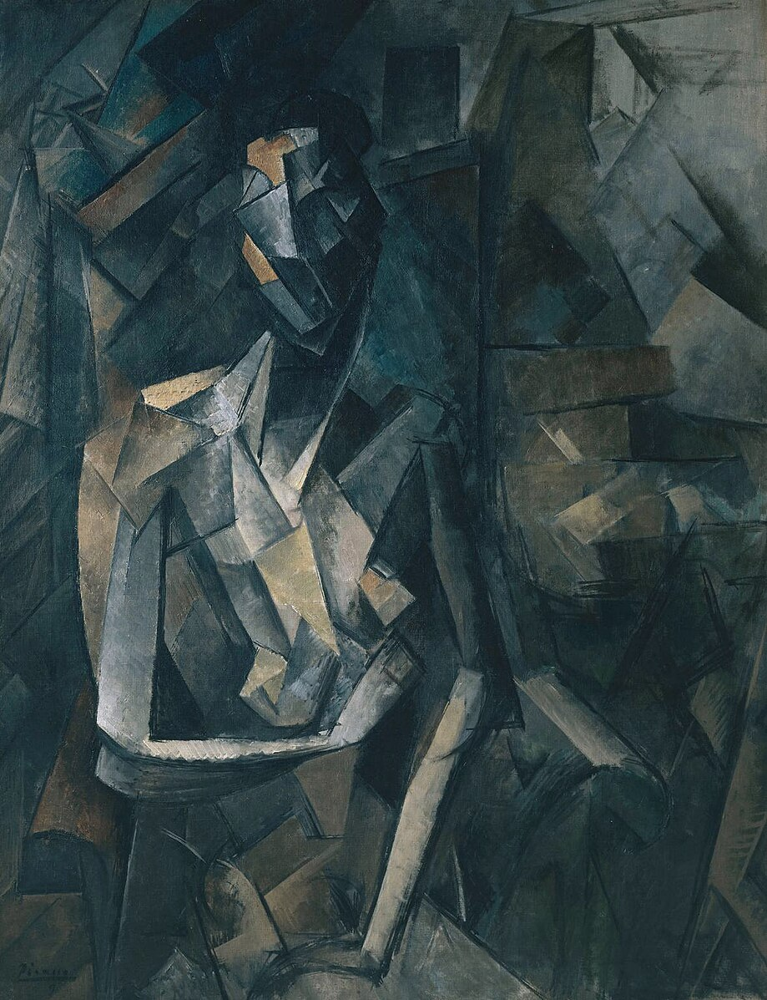

In [57]:
! wget "https://upload.wikimedia.org/wikipedia/en/thumb/8/8f/Pablo_Picasso%2C_1909-10%2C_Figure_dans_un_Fauteuil_%28Seated_Nude%2C_Femme_nue_assise%29%2C_oil_on_canvas%2C_92.1_x_73_cm%2C_Tate_Modern%2C_London.jpg/919px-Pablo_Picasso%2C_1909-10%2C_Figure_dans_un_Fauteuil_%28Seated_Nude%2C_Femme_nue_assise%29%2C_oil_on_canvas%2C_92.1_x_73_cm%2C_Tate_Modern%2C_London.jpg?20150127060348" -O picasso.jpg

image_size = 256
loader = transforms.Compose(
    [transforms.Resize((image_size, image_size)), transforms.ToTensor()]
)
style_image_path = "./picasso.jpg"
Image.open(style_image_path)


Do not write anything the cell below, it is for TAs

In [58]:
#begin_test

#end_test


Now it's time to test your code on texture synthesis

Generate texture using mean and variance of features

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

/usr/local/lib/python3.12/dist-packages/torch/optim/lbfgs.py:457: UserWarning: Converting a tensor with requires_grad=True to a scalar may lead to unexpected behavior.
Consider using tensor.detach() first. (Triggered internally at /pytorch/torch/csrc/autograd/generated/python_variable_methods.cpp:835.)
  loss = float(closure())


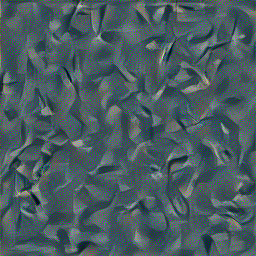

In [59]:
style_img = load_image(style_image_path, loader)
input_img = torch.randn(style_img.data.size(), device=device)
loss_method = "mean_var"

#begin_solution
torch.manual_seed(0)  # optional for reproducibility

extractor = StyleFeaturesExtractor(
    cnn,
    style_img,
    cnn_normalization_mean,
    cnn_normalization_std,
    num_layers=5  # 5–10 gives richer textures
)

output_img = run_texture_synthesis(
    style_features_extractor=extractor,
    input_img=input_img,
    num_steps=300,        # increase if you want more refinement
    loss_method=loss_method
)

out_pil = unload_image(output_img.clamp(0, 1))
display(out_pil)
out_pil.save("texture_mean_var.png")
#end_solution


Generate texture using gram matrix

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

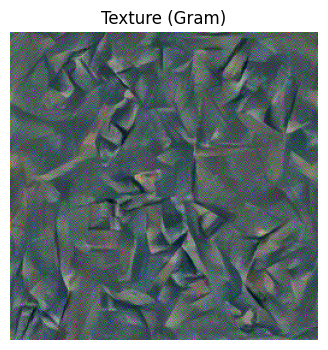

In [60]:
style_img = load_image(style_image_path, loader)
input_img = torch.randn(style_img.data.size(), device=device)

loss_method = "gram"

#begin_solution

# Build extractor (reach conv5_1 so KEY_CONVS {0,2,4,8,12} are available)
extractor = StyleFeaturesExtractor(
    cnn,
    style_img,
    cnn_normalization_mean,
    cnn_normalization_std,
    num_layers=16
)

# Run synthesis with Gram loss (crisper textures)
output_img = run_texture_synthesis(
    style_features_extractor=extractor,
    input_img=input_img,     # or torch.randn_like(style_img, device=device)
    num_steps=400,
    loss_method="gram"
)

# Visualize & save
out_pil = unload_image(output_img.clamp(0, 1))
plt.figure(figsize=(4, 4)); plt.imshow(out_pil); plt.axis("off"); plt.title("Texture (Gram)")
plt.show()
out_pil.save("texture_gram.png")

#end_solution


**Question 4c**
<a name='question4c'></a>

How can you improve the starting input to get more visually appealing results. Think about what you've learnt and implemented till now.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [61]:
style_img = load_image(style_image_path, loader)
input_img = torch.randn(style_img.data.size(), device=device)

loss_method = "gram"

#begin_solution
# Use a coloured-noise initiation that matches the style image's channel mean and variance
# Also add a tiny blur to remove pixel grit.

mu  = style_img.mean(dim=(2, 3), keepdim=True)
std = style_img.std(dim=(2, 3), keepdim=True).clamp(min=1e-6)

# Scale the noise (0.5× std) for stability purposes
input_img = (mu + 0.5 * std * torch.randn_like(style_img)).clamp(0, 1)

#end_solution


**Question 4d**
<a name='question4d'></a>

Find us a non-trivial texture that looks acceptable in mean, but not in gram.


Your answer

A cloud or foggy texture, matching average colour/brightness (mean/var) looks plausible, but Gram-matrix matching injects spurious correlations and hallucinates texture, so it looks worse.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

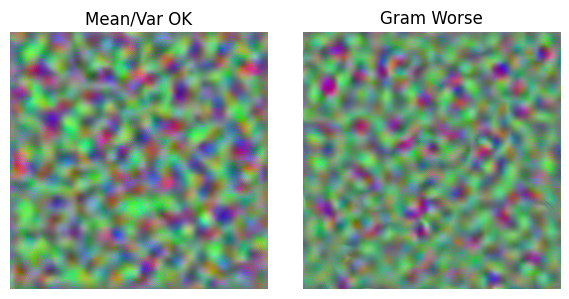

In [62]:
#begin_solution
H = W = image_size
torch.manual_seed(0)

# Start with tiny noise, then upsample -> low frequencies
base = torch.randn(1, 3, 32, 32, device=device)
style_img = F.interpolate(base, size=(H, W), mode='bilinear', align_corners=False)

# Aggressively smooth (low-pass) to remove high-frequency speckle
for _ in range(14):  # increase/decrease if you want more/less smoothness
    style_img = F.avg_pool2d(style_img, kernel_size=3, stride=1, padding=1)

# Normalize to [0,1] for display stability
mn = style_img.amin(dim=(2, 3), keepdim=True)
mx = style_img.amax(dim=(2, 3), keepdim=True)
style_img = (style_img - mn) / (mx - mn + 1e-8)

# --- Build extractor with early layers only ---
extractor = StyleFeaturesExtractor(
    cnn,
    style_img,
    cnn_normalization_mean,
    cnn_normalization_std,
    num_layers=5  # early VGG layers capture color/low-freq stats
)

# Keep classic early convs (conv1_1, conv2_1, conv3_1) -> indices {0,2,4}
keep = {0, 2, 4}
extractor.style_features = {k: v for k, v in extractor.style_features.items() if k in keep}

# --- Initialize input with colored noise (from 4c idea) ---
mu  = style_img.mean(dim=(2, 3), keepdim=True)
std = style_img.std(dim=(2, 3), keepdim=True).clamp(min=1e-6)
init = (mu + 0.5 * std * torch.randn_like(style_img)).clamp(0, 1)

# --- Synthesize: mean/var vs gram ---
steps = 600  # run a bit longer to make differences obvious
tex_mean = run_texture_synthesis(
    style_features_extractor=extractor,
    input_img=init.clone(),
    num_steps=steps,
    loss_method="mean_var",
)

tex_gram = run_texture_synthesis(
    style_features_extractor=extractor,
    input_img=init.clone(),
    num_steps=steps,
    loss_method="gram",
)

# --- Visualize ---
plt.figure(figsize=(6, 3))
plt.subplot(1, 2, 1); plt.imshow(unload_image(tex_mean.clamp(0, 1))); plt.title("Mean/Var OK"); plt.axis("off")
plt.subplot(1, 2, 2); plt.imshow(unload_image(tex_gram.clamp(0, 1))); plt.title("Gram Worse"); plt.axis("off")
plt.tight_layout(); plt.show()
#end_solution


**Question 4e**
<a name='question4e'></a>

Find us a non-trivial texture that looks acceptable in only gram.

Your answer
Gravel or pebbles. Gram captures the small and scattered stone pattern, while mean/var collapses it into flat grey, so only Gram looks acceptable.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

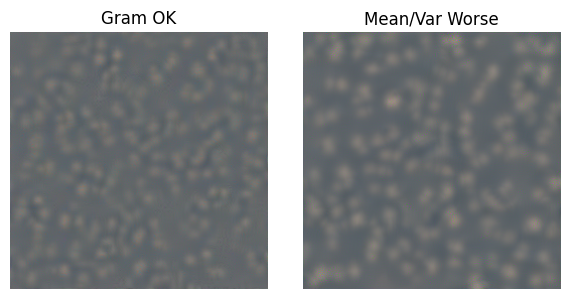

In [63]:
#begin_solution
H = W = image_size
torch.manual_seed(1)

# Sparse impulses
peb = torch.zeros(1, 1, H, W, device=device)
num_points = (H * W) // 300  # ~200 points for 256x256
ys = torch.randint(0, H, (num_points,), device=device)
xs = torch.randint(0, W, (num_points,), device=device)
peb[0, 0, ys, xs] = 1.0

# Gaussian blur (create blobs)
def gaussian_kernel(k=17, sigma=3.0):
    c = torch.arange(k, device=device) - (k - 1) / 2
    g = torch.exp(-(c ** 2) / (2 * sigma ** 2))
    g = g / g.sum()
    k2d = torch.outer(g, g)
    return k2d

k = gaussian_kernel(17, 3.0).unsqueeze(0).unsqueeze(0)  # (1,1,k,k)
peb = F.conv2d(peb, k, padding=8)
peb = F.conv2d(peb, k, padding=8)

# Normalize and shape blobs
peb = (peb - peb.amin(dim=(2, 3), keepdim=True)) / (peb.amax(dim=(2, 3), keepdim=True) - peb.amin(dim=(2, 3), keepdim=True) + 1e-8)
peb = peb.pow(0.75)

# Colorize foreground/background (stone tone + darker ground)
bg = torch.tensor([0.35, 0.38, 0.40], device=device).view(1, 3, 1, 1)
fg = torch.tensor([0.60, 0.55, 0.50], device=device).view(1, 3, 1, 1)
style_img = bg * (1 - peb) + fg * peb
style_img = style_img.clamp(0, 1)

# --- Extract style (use classic Gram layers) ---
extractor = StyleFeaturesExtractor(
    cnn,
    style_img,
    cnn_normalization_mean,
    cnn_normalization_std,
    num_layers=16
)
# Keep conv1_1, conv2_1, conv3_1, conv4_1, conv5_1
keep = {0, 2, 4, 8, 12}
extractor.style_features = {k: v for k, v in extractor.style_features.items() if k in keep}

# --- Initialize input with colored-noise (more stable) ---
mu  = style_img.mean(dim=(2, 3), keepdim=True)
std = style_img.std(dim=(2, 3), keepdim=True).clamp(min=1e-6)
init = (mu + 0.5 * std * torch.randn_like(style_img)).clamp(0, 1)

# --- Optimize: Gram should recreate discrete stones; Mean/Var will smear them ---
steps = 700
tex_gram = run_texture_synthesis(
    style_features_extractor=extractor,
    input_img=init.clone(),
    num_steps=steps,
    loss_method="gram",
)
tex_mean = run_texture_synthesis(
    style_features_extractor=extractor,
    input_img=init.clone(),
    num_steps=steps,
    loss_method="mean_var",
)

# --- Visualize ---
plt.figure(figsize=(6, 3))
plt.subplot(1, 2, 1); plt.imshow(unload_image(tex_gram.clamp(0, 1))); plt.title("Gram OK"); plt.axis("off")
plt.subplot(1, 2, 2); plt.imshow(unload_image(tex_mean.clamp(0, 1))); plt.title("Mean/Var Worse"); plt.axis("off")
plt.tight_layout(); plt.show()#end_solution


**Question 4f**
<a name='question4f'></a>

Failure case.
We give you an exemplar with regular patterns. It fails. Can you fix it? Explain why.

--2025-11-10 12:57:50--  https://i.pinimg.com/1200x/d7/ab/78/d7ab78073fa05268a02f9b381064364b.jpg
Resolving i.pinimg.com (i.pinimg.com)... 23.59.80.64, 23.59.80.66, 23.59.80.57, ...
Connecting to i.pinimg.com (i.pinimg.com)|23.59.80.64|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 616756 (602K) [image/jpeg]
Saving to: ‘regular_pattern.png’

regular_pattern.png 100%[===================>] 602.30K  1.92MB/s    in 0.3s    

2025-11-10 12:57:51 (1.92 MB/s) - ‘regular_pattern.png’ saved [616756/616756]



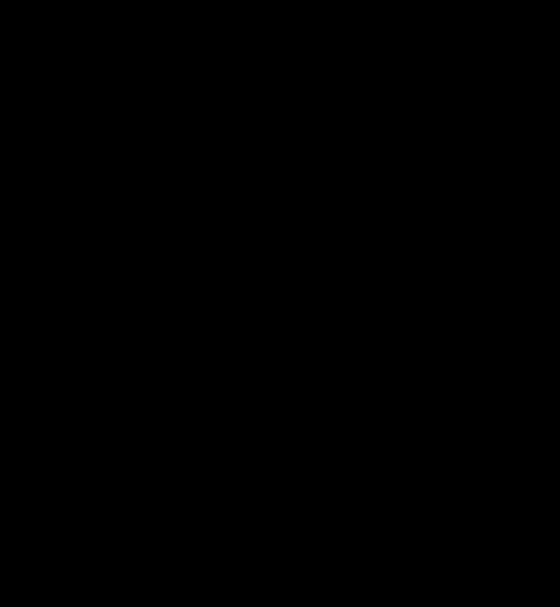

In [64]:
! wget "https://i.pinimg.com/1200x/d7/ab/78/d7ab78073fa05268a02f9b381064364b.jpg" -O regular_pattern.png
regular_image_path = "./regular_pattern.png"
Image.open(regular_image_path)

Test your method with the your implentation on this image to see it fails!

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

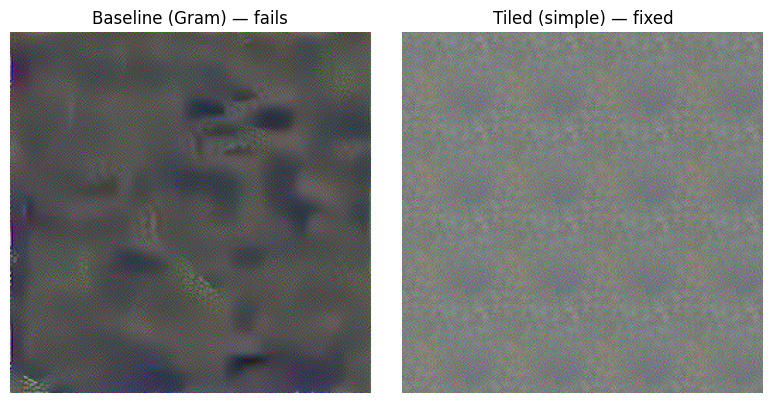

In [65]:
style_img = load_image(regular_image_path, loader)
input_img = torch.randn(style_img.data.size(), device=device)
loss_method = "gram"

#begin_solution
baseline_extractor = StyleFeaturesExtractor(
    cnn, style_img, cnn_normalization_mean, cnn_normalization_std, num_layers=5
)
baseline_in = torch.randn_like(style_img, device=device)
synth_fail = run_texture_synthesis(
    style_features_extractor=baseline_extractor,
    input_img=baseline_in,
    num_steps=300,
    loss_method="gram",
).clamp(0, 1)

# Build style model (Gram) and gather style losses for the FIX
sfe = StyleFeaturesExtractor(
    cnn, style_img, cnn_normalization_mean, cnn_normalization_std, num_layers=16
)
keep = {0, 2, 4, 8, 12}  # conv1_1..conv5_1
sfe.style_features = {k: v for k, v in sfe.style_features.items() if k in keep}

model, style_losses = get_style_model_and_losses(sfe, loss_method="gram")
for p in model.parameters():
    p.requires_grad_(False)
model.eval()

# Learn a small tile; the final image is that tile repeated
H, W = style_img.shape[-2:]
T = 64  # try 32/64/96 to match the period

z = torch.randn(1, 3, T, T, device=device, requires_grad=True)
opt = optim.Adam([z], lr=0.07)

def make_tiled(z, H, W):
    tile = z.sigmoid()                                   # (1,3,T,T)
    reps_y = (H + T - 1) // T
    reps_x = (W + T - 1) // T
    tiled = tile.repeat(1, 1, reps_y, reps_x)[:, :, :H, :W]
    return tiled

steps = 700
lambda_tv = 1e-4

for t in range(steps):
    x = make_tiled(z, H, W)
    opt.zero_grad()

    model(x)  # StyleLoss hooks accumulate
    gram_loss = torch.zeros((), device=x.device, dtype=x.dtype)
    for sl in style_losses:
        gram_loss = gram_loss + sl.loss

    # tiny TV to reduce tile-edge jaggies
    tv = ((x[:, :, :, 1:] - x[:, :, :, :-1])**2).mean() + ((x[:, :, 1:, :] - x[:, :, :-1, :])**2).mean()

    loss = gram_loss + lambda_tv * tv
    loss.backward()
    opt.step()

synth_fix = make_tiled(z, H, W).detach().clamp(0, 1)

plt.figure(figsize=(8,4))
plt.subplot(1,2,1); plt.imshow(unload_image(synth_fail)); plt.title("Baseline (Gram) — fails"); plt.axis("off")
plt.subplot(1,2,2); plt.imshow(unload_image(synth_fix)); plt.title("Tiled (simple) — fixed"); plt.axis("off")
plt.tight_layout(); plt.show()
#end_solution


Implement your solution to fix it. Also explain in a few words.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

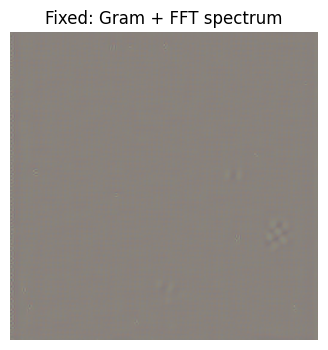

Why baseline fails: Gram stats are stationary and ignore phase/periodicity. Adding a Fourier spectrum loss matches the periodic peaks, restoring the regular pattern.


In [66]:
style_img = load_image(regular_image_path, loader)
input_img = torch.randn(style_img.data.size(), device=device)

#begin_solution
reg_loader = transforms.Compose([transforms.Resize((256,256)), transforms.ToTensor()])
style_img = load_image(regular_image_path, reg_loader)

# Build style model (Gram) and gather style losses
sfe = StyleFeaturesExtractor(
    cnn, style_img, cnn_normalization_mean, cnn_normalization_std, num_layers=5
)
model, style_losses = get_style_model_and_losses(sfe, loss_method="gram")

# ---- Fourier spectrum loss to enforce periodicity ----
def power_spectrum(img: torch.Tensor) -> torch.Tensor:
    # img: (1,3,H,W) in [0,1]  -> log power spectrum averaged over channels
    X = torch.fft.rfft2(img, norm="ortho")
    mag = torch.abs(X).mean(dim=1, keepdim=True)
    return torch.log1p(mag)

target_spec = power_spectrum(style_img).detach()

# Optimize (Adam is faster here)
synth = torch.rand_like(style_img)
opt = optim.Adam([synth.requires_grad_()], lr=0.25)
lambda_fft = 1.0  # weight for spectrum loss

steps = 400
for t in range(steps):
    opt.zero_grad(set_to_none=True)
    _ = model(synth)

    style_score = 0.0
    for sl in style_losses:
        style_score = style_score + sl.loss

    fft_loss = F.mse_loss(power_spectrum(synth), target_spec)
    loss = style_score + lambda_fft * fft_loss
    loss.backward()
    opt.step()

    with torch.no_grad():
        synth.clamp_(0,1)

out_pil = unload_image(synth)
plt.figure(figsize=(4,4)); plt.imshow(out_pil); plt.axis("off"); plt.title("Fixed: Gram + FFT spectrum")
plt.show()
print("Why baseline fails: Gram stats are stationary and ignore phase/periodicity. "
      "Adding a Fourier spectrum loss matches the periodic peaks, restoring the regular pattern.")
#end_solution


Your answer

**Question 4g**
<a name='question4g'></a>

How can you use the answer of this section to generate a good hidden test image for Question 2. Write no more than one sentence.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [67]:
#begin_solution

#end_solution


Your answer

## 5. Implicit Neural Representation (30 points)
The objective here is to learn an implicit neural function to predict frames of an animated 2D object. That is, learn a function $f(x,y,t; \theta)$, where $\theta$ are learnable MLP weights, that takes as input pixel coordinates $x,y$ and time $t$ and predicts the pixel value at that location and time. The learned function should then be able to generate frames of the video at any given instance $t$. The task is divided into multiple incremental blocks as below:

[a)](#question5a) Fit an MLP model to a _single_ image. **(5 points)**

[b)](#question5b) Add positional encoding of pixels to improve prediction. **(5 points)**

[c)](#question5c) Adapt the framework to train an MLP to fit a sequence of frames instead of a single frame. **(8 points)**

[d)](#question5d) Fit the MLP to the sequence of frames with and without positional encoding on time, and report the result for both **(2 points)**

[e)](#question5e) Implement batching, to prevent memory issues when evaluating large number of pixels with the MLP. Size of a batch should not exceed 16000 **(5 points)**

[f)](#question5f) Generate a video of 100 frames uniformly sampled between the first and last frame. Since you trained on only 11 frames, by generating 100 frames you're interpolating unseen video frames. If your method works correctly, it should produce a continuous motion. If you overfit on the training frames, then it would give a discontinuous or jagged motion **(5 points)**


**Let's Prepare the animation inputs**

In [68]:
!wget 'https://upload.wikimedia.org/wikipedia/commons/0/07/The_Horse_in_Motion-anim.gif'

X = np.zeros((11,230,340),dtype=np.uint8)
with imageio.get_reader('The_Horse_in_Motion-anim.gif') as r:
    for i in range(11):
        X[i] = r.get_data(i)
        X[i,0:20] = 255
        X[i,200:] = 255
        X[i,:,300:] = 255
        X[i,:,:10] = 255

X_resized = np.stack([cv2.resize(X[k], (128,128), cv2.INTER_AREA) for k in range(X.shape[0])], axis=0)
for i in range(X_resized.shape[0]):
  X_resized[i] = np.where(X_resized[i]>60,0,1)

--2025-11-10 12:58:23--  https://upload.wikimedia.org/wikipedia/commons/0/07/The_Horse_in_Motion-anim.gif
Resolving upload.wikimedia.org (upload.wikimedia.org)... 103.102.166.240, 2001:df2:e500:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|103.102.166.240|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 648978 (634K) [image/gif]
Saving to: ‘The_Horse_in_Motion-anim.gif’

The_Horse_in_Motion 100%[===================>] 633.77K  --.-KB/s    in 0.02s   

2025-11-10 12:58:23 (25.0 MB/s) - ‘The_Horse_in_Motion-anim.gif’ saved [648978/648978]



Let's visualize the frames:

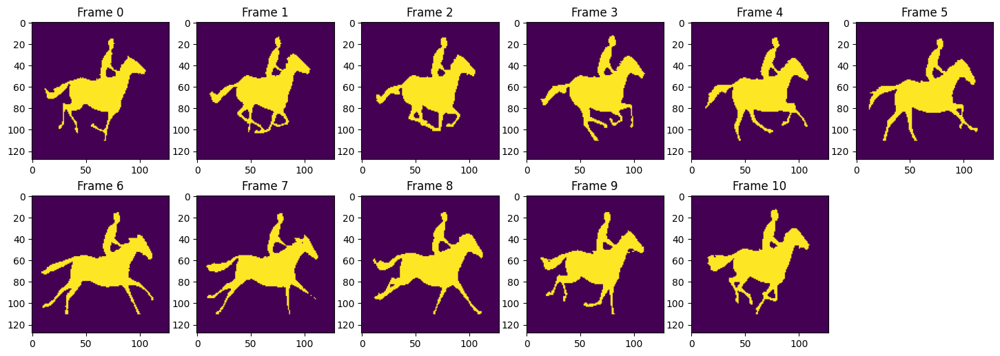

In [69]:
plt.figure(figsize=(6*3,2*3))
for i in range(11):
    plt.subplot(2,6,i+1)
    plt.imshow(X_resized[i])
    plt.title(f'Frame {i}')
plt.show()
plt.close()

Save the frames as a video sequence

In [70]:
output_path = 'input_bw_video.mp4'
with imageio.get_writer(output_path, mode='I', fps=10) as writer:
        for k in range(X_resized.shape[0]):
            writer.append_data(255*X_resized[k])
Video(output_path)

In [71]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Visualization util method

In [72]:
def plot_implicit_representation_single_image(image, model, device='cuda'):

    '''
    Visualize implicit representation of image from training the MLP model

    Args:
        - image TORCHFLOAT32 (H,W)
        - model MLP model which takes as input batches (BATCH,K) and return pixel prediction of dim (BATCH,1)
    '''

    with torch.no_grad():
        U = predict_image(image, model, device=device)
    U = U.reshape((1,image.shape[0],image.shape[1]))
    U_bw = (U>0.5).type(torch.int32).cpu()

    plt.figure(figsize=(12,6))

    plt.subplot(1,3,1)
    plt.title('Implicit rep.')
    plt.imshow(U[0].cpu().numpy())
    plt.colorbar()
    plt.clim(0,1)

    plt.subplot(1,3,2)
    plt.imshow(U_bw[0].cpu().numpy())
    plt.title('Prediction')

    plt.subplot(1,3,3)
    plt.imshow(image.cpu())
    plt.title('Ground truth')

def plot_implicit_representation_multi_images(images, model, device='cuda'):

    '''
    Visualize implicit representation of a set of images from training the MLP model

    Args:
        - images TORCHFLOAT32 (N,H,W)
        - model MLP model which takes as input batches (BATCH,K) and return pixel prediction of dim (BATCH,1)
    '''

    with torch.no_grad():
        U = predict_images(images, model, device=device)
    U = U.reshape((images.shape[0],images.shape[1],images.shape[2])).cpu()
    U_bw = (U>0.5).type(torch.int32).cpu()

    for i in range(images.shape[0]):

        plt.figure(figsize=(12,6))

        plt.subplot(1,3,1)
        plt.title('Implicit rep.')
        plt.imshow(U[i].cpu().numpy())
        plt.colorbar()
        plt.clim(0,1)

        plt.subplot(1,3,2)
        plt.imshow(U_bw[i].cpu().numpy())
        plt.title('Prediction')

        plt.subplot(1,3,3)
        plt.imshow(images[i].cpu())
        plt.title(f'Ground truth Frame {i}')

def plot_loss_and_accuracy(loss_list,accuracy_list):
    plt.figure(figsize=(8*2,6))

    plt.subplot(1,2,1)
    plt.plot([x[0] for x in loss_list], [x[1] for x in loss_list])
    plt.title('Training loss')
    plt.xlabel('epochs')

    plt.subplot(1,2,2)
    plt.plot([x[0] for x in accuracy_list], [x[1] for x in accuracy_list])
    plt.title('Accuracy')
    plt.ylim(0.,1.)
    plt.xlabel('epochs')

**Question 5a**
<a name='question5a'></a>

Fit an MLP model to a single image

Below, write a MLP model which takes as input a pixel position (x,y) and return a pixel value prediction $p_{x,y}$

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [73]:
class MLP(nn.Module):
    '''
    MLP class
    '''
    def __init__(self,input_dimension, nb_layers, embedding_dimension, output_dimension):
        super(MLP, self).__init__()

        #begin_solution
        layers = []
        in_dim = input_dimension

        # Hidden layers
        for _ in range(max(nb_layers, 0)):
            layers.append(nn.Linear(in_dim, embedding_dimension))
            layers.append(nn.ReLU(inplace=True))
            in_dim = embedding_dimension

        # Output layer
        layers.append(nn.Linear(in_dim, output_dimension))

        self.net = nn.Sequential(*layers)

        # Xavier init for linear layers
        for m in self.net.modules():
            if isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight)
                if m.bias is not None:
                    nn.init.zeros_(m.bias)
        #end_solution


    def forward(self, input):
        #begin_solution
        prediction = self.net(input)
        #end_solution

        return prediction

Write a function which samples random pixel positions in an image

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [74]:
## Sample random pixel positions
def sample_image(image, n, scaled=True):
  '''
  Args:
    - image TORCHINT32 (H, W)
    - n : int, number of positions to sample
    - scaled: bool, if True, divide by the dimension
  Returns:
    - sampled_positions TORCHFLOAT32 ((n,2)), sampled positions
    - pixel_values TORCHINT32((n,)), sampled pixel values
  '''

  #begin_solution
  H, W = image.shape
  device = image.device

  # sample integer pixel indices
  ys = torch.randint(0, H, (n,), device=device)
  xs = torch.randint(0, W, (n,), device=device)

  # gather pixel values
  pixel_values = image[ys, xs].to(torch.int32)

  # build (x, y) positions
  sampled_positions = torch.stack([xs, ys], dim=1).to(torch.float32)

  if scaled:
      sampled_positions[:, 0] /= (W - 1)
      sampled_positions[:, 1] /= (H - 1)
  #end_solution


  return sampled_positions, pixel_values

Write a function that takes and image and a trained MLP and predicts all pixel values of the image. That is, for every $x,y$ in the given image, predict its pixel value with the MLP.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [75]:
def predict_image(image, model, device='cuda', scale=True):
  '''
  Reconstruct the complete set of images from the overfitted MLP model

  Args:
    - images TORCH_INT32 (H, W)
    - model, takes as input a batch of pixel positions and return pixel value
  Return:
    - prediction TORCHFLOAT32 (H, W) [CPU]
  '''
  #begin_solution
  H, W = image.shape
  device = torch.device(device if torch.cuda.is_available() or str(device) == "cpu" else "cpu")

  # Build full grid of (x, y) positions
  ys = torch.arange(H, device=device)
  xs = torch.arange(W, device=device)
  yy, xx = torch.meshgrid(ys, xs, indexing='ij')             # yy: (H,W)=y, xx: (H,W)=x
  coords = torch.stack([xx.reshape(-1), yy.reshape(-1)], 1)   # (H*W, 2)

  coords = coords.to(torch.float32)
  if scale:
      coords[:, 0] /= (W - 1)
      coords[:, 1] /= (H - 1)

  # Batched inference to avoid OOM (<= 16000 as per spec)
  model = model.to(device).eval()
  batch_size = 16000
  preds = []
  with torch.no_grad():
      for i in range(0, coords.shape[0], batch_size):
          batch = coords[i:i+batch_size].to(device)
          out = model(batch)                       # (B,1) or (B,)
          if out.ndim == 2 and out.shape[1] == 1:
              out = out[:, 0]
          preds.append(out.detach().cpu())

  prediction = torch.cat(preds, dim=0).reshape(H, W).to(torch.float32)
  #end_solution


  return prediction

Write a function to evaluate the model's prediction performance

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [76]:
## Compute accuracy over the set of frames
def eval_accuracy(image, model, device='cuda'):
  '''
  Args:
    - images TORCH_INT32 (H, W)
    - model, takes as input a batch of pixel positions and return pixel value
  Return:
    - mean_accuracy FLOAT32
  '''

  #begin_solution
  pred = predict_image(image, model, device=device)         # (H, W) float32 on CPU

  # Binarize predictions and ground-truth
  y_pred = (pred > 0.5).to(torch.int32)
  y_true = (image.cpu() > 0.5).to(torch.int32)

  # Mean accuracy
  accuracy = (y_pred == y_true).float().mean().item()
  #end_solution


  return accuracy

Write the training loop. Train for a suitable number of epochs and while training populate the lists loss_list and accuracy_list with scalar values. These lists can be used for plotting later.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [77]:
loss_list, accuracy_list = [], []

#begin_solution
# Ensure image_t is torch.int32 for sampling
img_np = X_resized[0]                   # (128,128) numpy array with {0,1}
image_t = torch.from_numpy(img_np).to(device=device, dtype=torch.int32) # Change dtype to int32

# --- Build model ---
model = MLP(input_dimension=2, nb_layers=4, embedding_dimension=128, output_dimension=1).to(device)
criterion = nn.BCEWithLogitsLoss() # Use BCEWithLogitsLoss for stability with unnormalized output
optimizer = optim.Adam(model.parameters(), lr=1e-3)

# --- Training hyperparams ---
EPOCHS = 400
SAMPLES_PER_EPOCH = min(16000, image_t.numel())  # abide by 16000 cap
EVAL_EVERY = 10

loss_list, accuracy_list = [], []

for epoch in range(1, EPOCHS + 1):
    model.train()

    # Sample random pixel coordinates and targets
    coords, pix = sample_image(image_t, n=SAMPLES_PER_EPOCH, scaled=True)  # coords: (N,2), pix: (N,)
    coords = coords.to(device)
    targets = pix.to(device, dtype=torch.float32).unsqueeze(1)             # (N,1)

    # Forward + loss
    preds = model(coords)                                                  # (N,1) in [0,1]
    loss = criterion(preds, targets)

    # Backprop
    optimizer.zero_grad(set_to_none=True)
    loss.backward()
    optimizer.step()

    # Track metrics
    if epoch % EVAL_EVERY == 0 or epoch == 1:
        acc = eval_accuracy(image_t, model, device=device)
        loss_list.append((epoch, float(loss.item())))
        accuracy_list.append((epoch, float(acc)))
#end_solution

Save the model (needed for marking)

In [78]:
if not os.path.exists("models/"):
  os.makedirs("./models/")
torch.save({"model":model}, "models/implicit_single_image.pth")

Load the trained model

In [79]:
state_dict = torch.load("models/implicit_single_image.pth", weights_only=False)
model = state_dict["model"].to(device)

Let's plot our performance

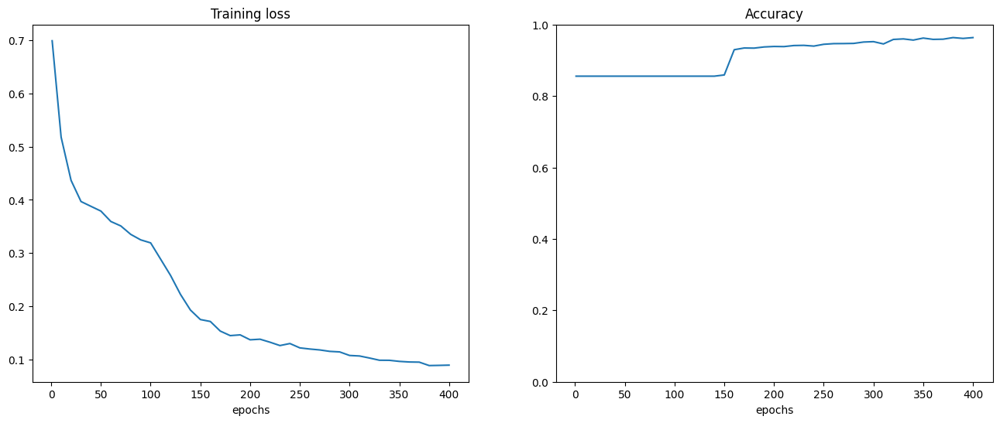

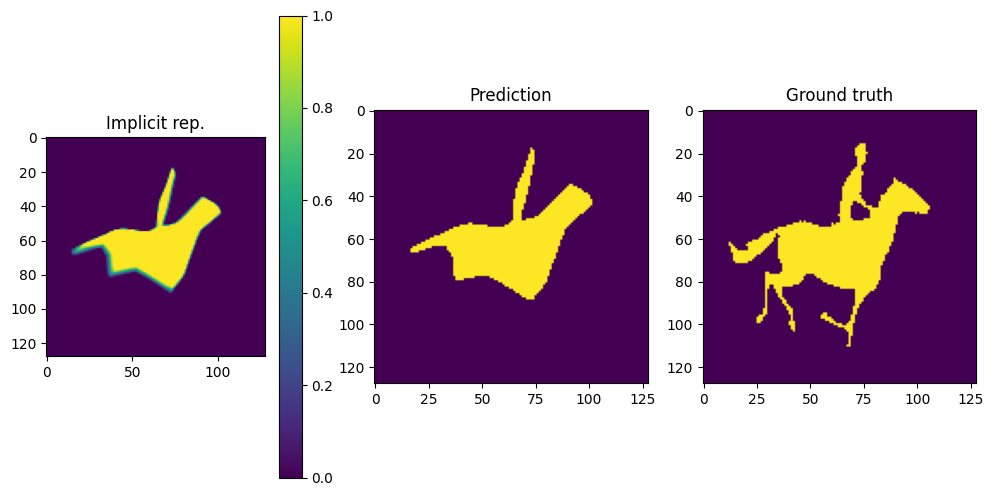

In [80]:
plot_loss_and_accuracy(loss_list,accuracy_list)
plot_implicit_representation_single_image(image_t, model, device=device)

**Question 5b**
<a name='question5b'></a>

Add positional encoding of pixels to improve predictions.

Write a function that positionally encodes the input.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [81]:
def positional_embedding_power_ls(X,L, cst=torch.pi):
    #begin_solution

    device, dtype = X.device, X.dtype
    D = X.shape[-1]

    # Frequencies: [π·2^0, π·2^1, ..., π·2^(L-1)]
    freqs = (2.0 ** torch.arange(L, device=device, dtype=dtype)) * cst  # (L,)

    # Broadcast: angles shape (..., L, D)
    angles = X.unsqueeze(-2) * freqs.view(*([1] * (X.dim() - 1)), L, 1)

    # Cos/Sin encodings, then flatten last two dims -> (..., L*D)
    cos_encoding = torch.cos(angles).reshape(*X.shape[:-1], L * D)
    sin_encoding = torch.sin(angles).reshape(*X.shape[:-1], L * D)
    #end_solution

    return torch.cat([cos_encoding,sin_encoding], axis=-1)

Write a new MLP, while reusing the previous MLP model, that can predict using the positionally encoded pixel locations.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [82]:
class MLP_PE(nn.Module):
    '''
    MLP with positional encoding class
    '''
    def __init__(self,input_dimension, nb_layers, embedding_dimension, output_dimension, positional_enc_L=0):
        super(MLP_PE, self).__init__()
        #begin_solution
        self.L = int(positional_enc_L)
        pe_extra = (2 * self.L * input_dimension) if self.L > 0 else 0
        in_dim = input_dimension + pe_extra

        # Reuse the previously defined MLP as the backbone
        self.backbone = MLP(in_dim, nb_layers, embedding_dimension, output_dimension)
        #end_solution


    def forward(self, input):

        #begin_solution
        if self.L > 0:
            pe = positional_embedding_power_ls(input, self.L)  # (..., 2*L*D)
            x = torch.cat([input, pe], dim=-1)
        else:
            x = input

        prediction = self.backbone(x)   # logits or probs depending on your loss choice
        #end_solution


        return prediction

Write the training loop similar to before. Train for a suitable number of epochs and while training populate the lists loss_list and accuracy_list with scalar values. These lists can be used for plotting later.

In [83]:
loss_list, accuracy_list = [], []

#begin_solution
IN_DIM = 2            # (x,y)
HIDDEN = 128
LAYERS = 5
OUT_DIM = 1
PE_L = 6            # number of frequency bands for PE
EPOCHS = 400
BATCH_N= 8192
LR = 1e-3

# Model, loss, optimizer
model = MLP_PE(IN_DIM, LAYERS, HIDDEN, OUT_DIM, positional_enc_L=PE_L).to(device)
criterion = torch.nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=LR)

# Train on a single frame (assumes your image tensor is named `image_t`, shape (H,W) in {0,1})
for epoch in range(1, EPOCHS + 1):
    model.train()

    # Sample random pixel positions + targets
    pos, vals = sample_image(image_t, BATCH_N, scaled=True)   # pos: (N,2) in [0,1], vals: (N,)
    pos = pos.to(device)
    y = vals.float().unsqueeze(1).to(device)

    # Forward / backward
    optimizer.zero_grad()
    logits = model(pos)                     # (N,1), unnormalized
    loss = criterion(logits, y)
    loss.backward()
    optimizer.step()

    # Track metrics every epoch
    with torch.no_grad():
        acc = eval_accuracy(image_t, model, device=device)

    loss_list.append((epoch, float(loss.item())))
    accuracy_list.append((epoch, float(acc)))
#end_solution


Save the model (needed for marking)

In [84]:
if not os.path.exists("models/"):
  os.makedirs("./models/")
torch.save({"model":model}, "models/implicit_single_image_positional_encoding.pth")

Load the trained model

In [85]:
state_dict = torch.load("models/implicit_single_image_positional_encoding.pth", weights_only=False)
model = state_dict["model"].to(device)

Let's plot our performance.

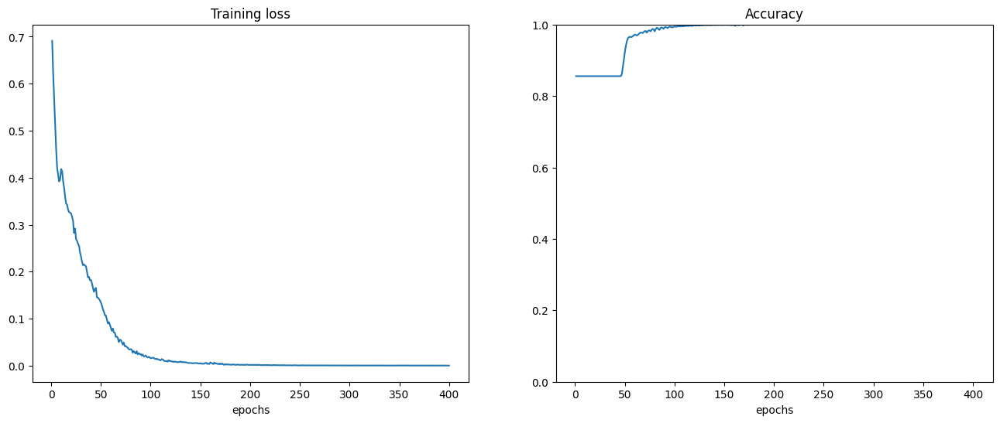

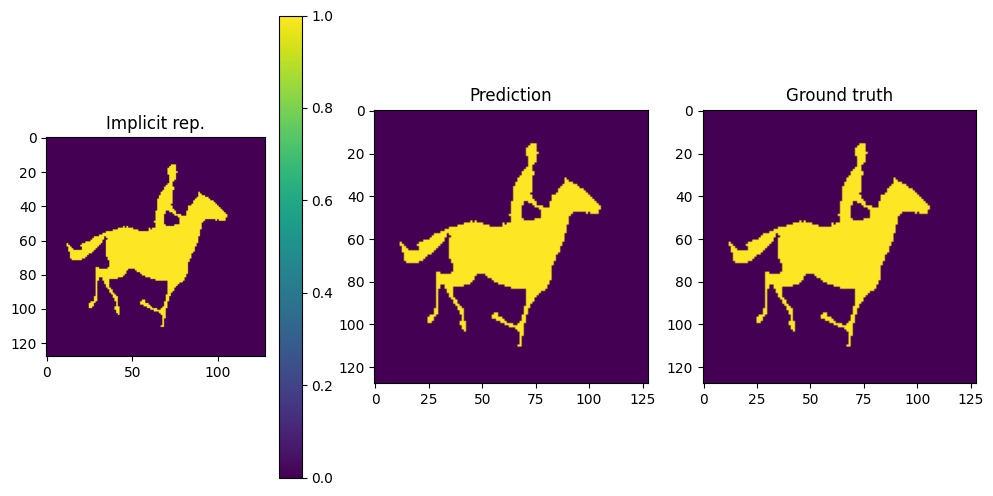

In [86]:
plot_loss_and_accuracy(loss_list,accuracy_list)
plot_implicit_representation_single_image(image_t, model, device=device)

**Question 5c**
<a name='question5c'></a>

Adapt the framework to train an MLP to fit a sequence of frames instead of a single frame. You'd need to rewrite image sampling and other functions to achieve this.

Write a function that can now also sample across the time dimension.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [87]:
def sample_images(images, n, scaled=True):
  '''
  Args:
    - images TORCHINT32 (N_frames, H, W)
    - n : int, number of positions to sample
    - scaled: bool, if True, divide by the dimension
  Returns:
    - sampled_positions TORCHFLOAT32 ((n,3)), sampled positions
    - pixel_values TORCHINT32((n,)), sampled pixel values
  '''

  #begin_solution

  T, H, W = images.shape
  device = images.device

    # Random indices
  ys = torch.randint(0, H, (n,), device=device)
  xs = torch.randint(0, W, (n,), device=device)
  ts = torch.randint(0, T, (n,), device=device)

    # Gather pixel values
  pixel_values = images[ts, ys, xs].to(torch.int32)

    # Coordinates (optionally scaled to [0,1])
  if scaled:
      xs_f = xs.to(torch.float32) / max(W - 1, 1)
      ys_f = ys.to(torch.float32) / max(H - 1, 1)
      ts_f = ts.to(torch.float32) / max(T - 1, 1)
  else:
      xs_f = xs.to(torch.float32)
      ys_f = ys.to(torch.float32)
      ts_f = ts.to(torch.float32)

  sampled_positions = torch.stack([xs_f, ys_f, ts_f], dim=1)  # (n, 3)
  #end_solution

  return sampled_positions, pixel_values


Write a function to predict the images, now also across time.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [88]:
def predict_images(images, model, device='cuda', scale=True):
  '''
  Reconstruct the complete set of images from the overfitted MLP model

  Args:
    - images TORCH_INT32 (N_frames, H, W)
    - model, takes as input a batch of pixel positions (K,2) and return pixel value (K,1)
  Return:
    - prediction TORCHFLOAT32 (N_frames, H, W) [CPU]
  '''
  #begin_solution
  T, H, W = images.shape

  # Resolve device
  dev = torch.device(str(device))
  if dev.type == "cuda" and not torch.cuda.is_available():
      dev = torch.device("cpu")

  model = model.to(dev).eval()

  # Precompute (x,y) grid once
  ys = torch.arange(H, dtype=torch.float32, device=dev)
  xs = torch.arange(W, dtype=torch.float32, device=dev)
  yy, xx = torch.meshgrid(ys, xs, indexing='ij')   # (H, W)
  xx_f = xx.reshape(-1)                             # (H*W,)
  yy_f = yy.reshape(-1)

  # Optional scaling to [0,1]
  if scale:
    if W > 1: xx_f = xx_f / (W - 1)
    if H > 1: yy_f = yy_f / (H - 1)

  CHUNK = 16000
  frames_out = []

  with torch.no_grad():
    for t in range(T):
      # time column (scaled if requested)
      tt_f = torch.full_like(xx_f, float(t))
      if scale and T > 1:
        tt_f = tt_f / (T - 1)

      coords = torch.stack([xx_f, yy_f, tt_f], dim=1)  # (H*W, 3)

      preds = []
      for s in range(0, coords.size(0), CHUNK):
        batch = coords[s:s+CHUNK]
        out = model(batch)                              # (B,1) or (B,)
        if out.ndim == 2 and out.shape[1] == 1:
          out = out.squeeze(1)

        # Convert logits -> probabilities only if needed
        if (out.min() < 0) or (out.max() > 1):
          out = torch.sigmoid(out)

        preds.append(out.detach().cpu())               # move each chunk to CPU

      frame = torch.cat(preds, dim=0).reshape(H, W).to(torch.float32)
      frames_out.append(frame)

  prediction = torch.stack(frames_out, dim=0)
  #end_solution


  return prediction

Write a function to evaluate performance across time.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [89]:
## Compute accuracy over the set of frames
def eval_mean_accuracy(images, model, device='cuda'):
  '''
  Args:
    - images TORCH_INT32 (N_frames, H, W)
    - model, takes as input a batch of pixel positions (K,2) and return pixel value (K,1)
  Return:
    - mean_accuracy FLOAT32
  '''
  #begin_solution
  with torch.no_grad():
      # Predict probabilities for all frames
      preds = predict_images(images, model, device=device, scale=True)   # (T,H,W) float32 on CPU in [0,1]
      pred_lbl = (preds > 0.5).to(torch.int32)

  gt = images.detach().cpu().to(torch.int32).clamp(0, 1)
  accuracy = (pred_lbl == gt).to(torch.float32).mean().item()
  #end_solution


  return accuracy

Write the training loop similar to before. Train for a suitable number of epochs and while training populate the lists loss_list and accuracy_list with scalar values. These lists can be used for plotting later.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [90]:
loss_list, accuracy_list = [], []

#begin_solution
images_t = torch.from_numpy(X_resized).to(device=device, dtype=torch.float32)  # (T,H,W) in {0,1}

# MLP that now takes (x, y, t)
model = MLP(input_dimension=3, nb_layers=5, embedding_dimension=128, output_dimension=1).to(device)

criterion = torch.nn.BCEWithLogitsLoss()     # use logits for stable training
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

EPOCHS = 400
BATCH_N = 16000           # do not exceed 16k as required
EVAL_EVERY = 10

for epoch in range(1, EPOCHS + 1):
    model.train()

    # sample across time and space
    coords, vals = sample_images(images_t, n=BATCH_N, scaled=True)   # coords: (N,3), vals: (N,)
    coords = coords.to(device)
    targets = vals.float().unsqueeze(1).to(device)                   # (N,1)

    # forward / loss / step
    logits = model(coords)                                           # (N,1) logits
    loss = criterion(logits, targets)

    optimizer.zero_grad(set_to_none=True)
    loss.backward()
    optimizer.step()

    # log metrics
    if epoch % EVAL_EVERY == 0 or epoch == 1:
        acc = eval_mean_accuracy(images_t, model, device=device)
        loss_list.append((epoch, float(loss.item())))
        accuracy_list.append((epoch, float(acc)))
#end_solution


Save the model (needed for marking)

In [91]:
if not os.path.exists("models/"):
  os.makedirs("./models/")
torch.save({"model":model}, "models/implicit_images_sequence.pth")

Load the trained model

In [92]:
state_dict = torch.load("models/implicit_images_sequence.pth", weights_only=False)
model = state_dict["model"].to(device)

Let's plot our performance

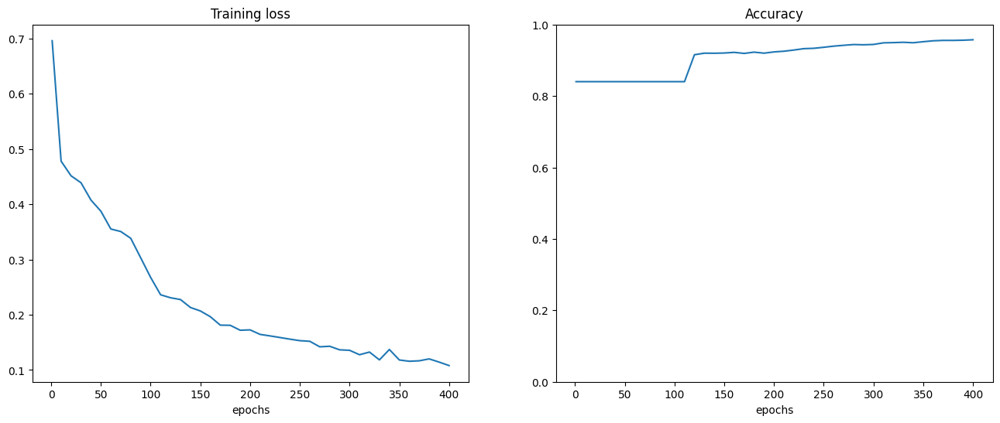

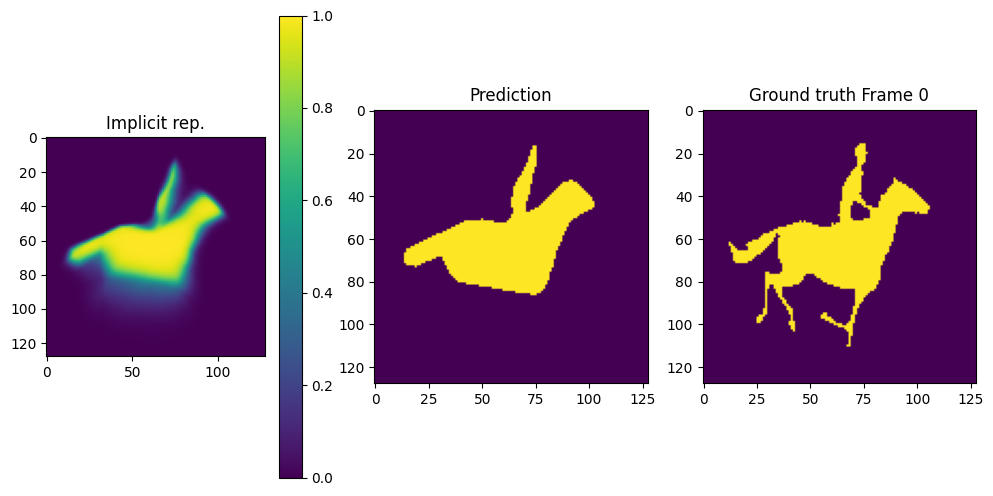

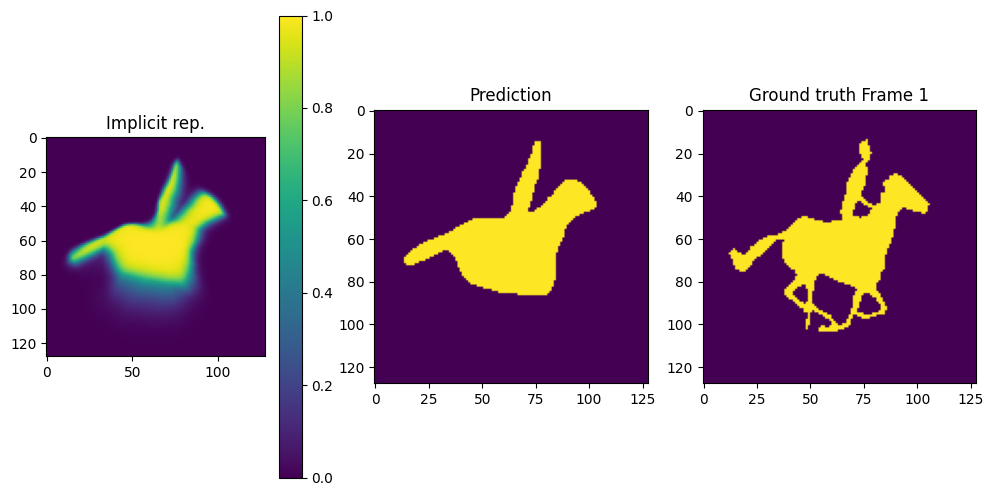

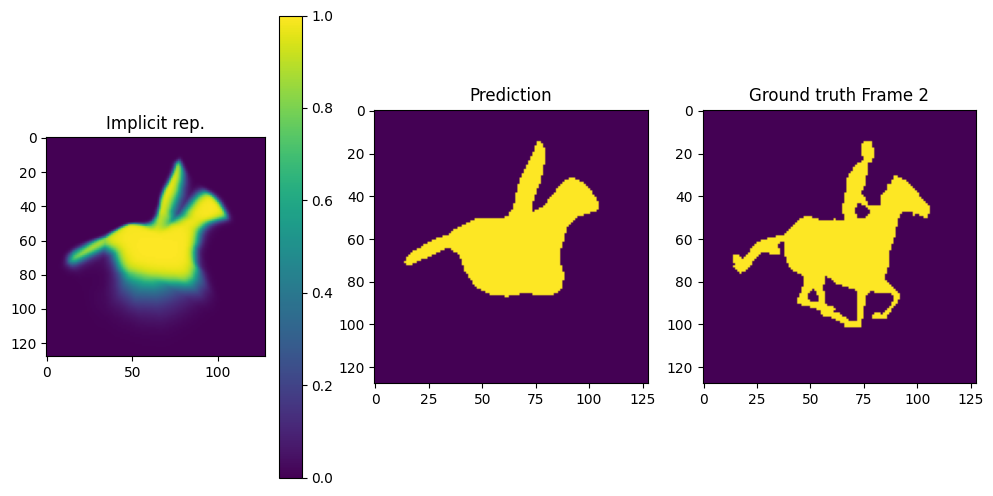

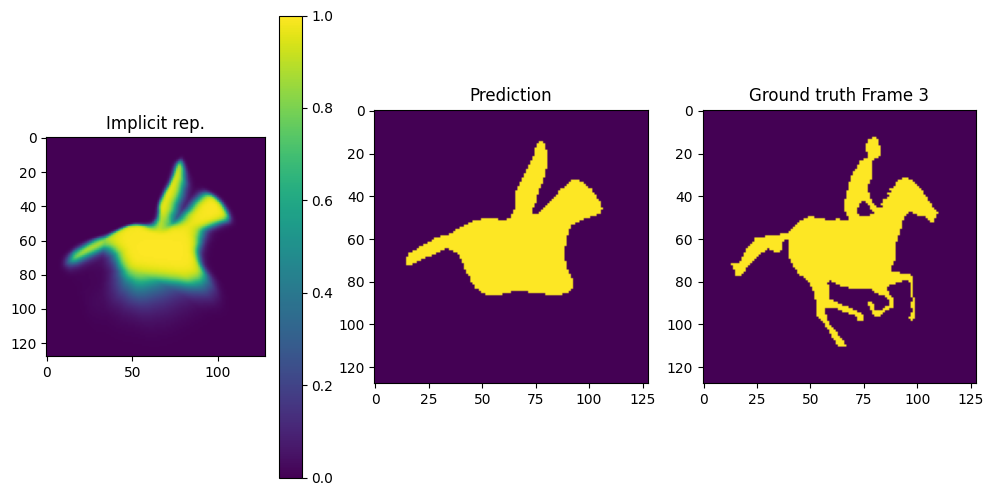

...

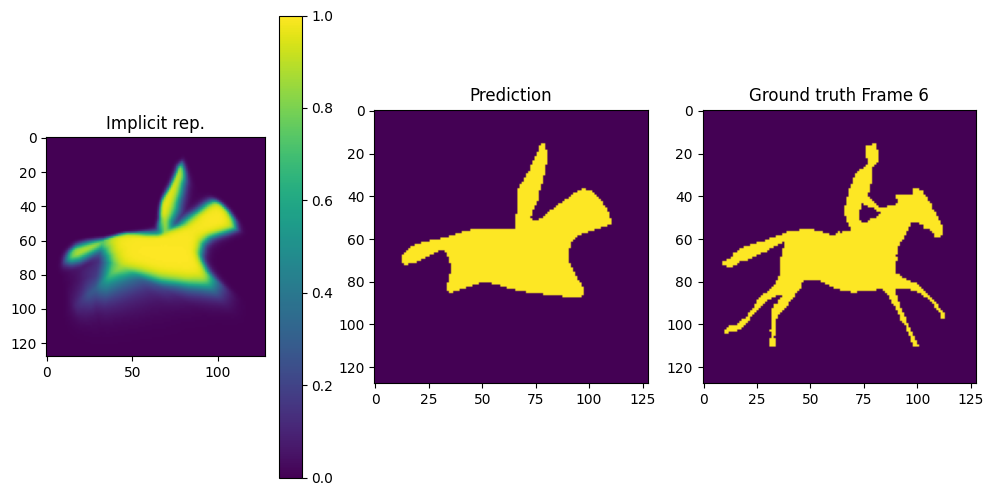

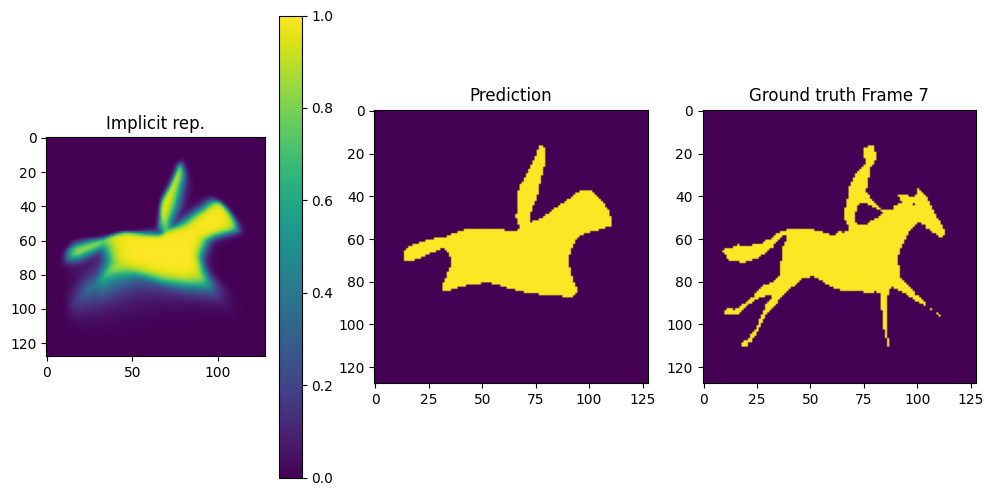

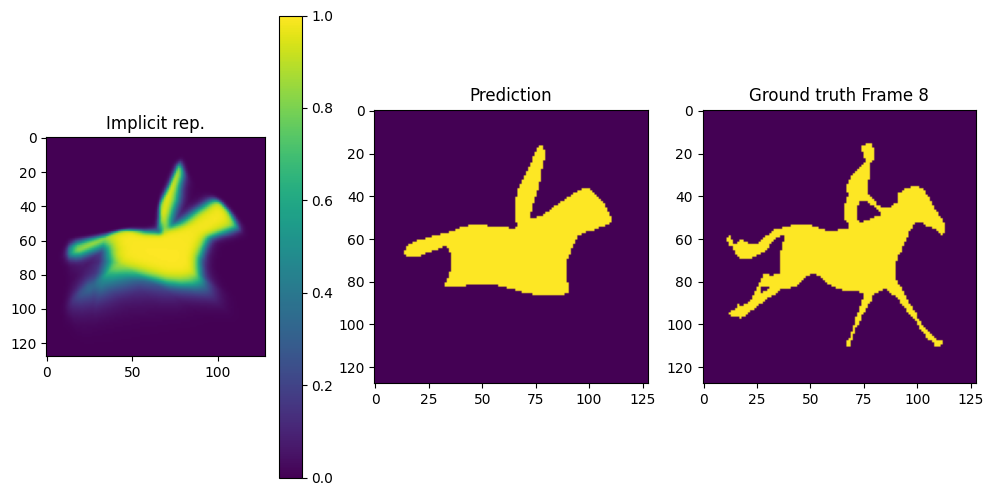

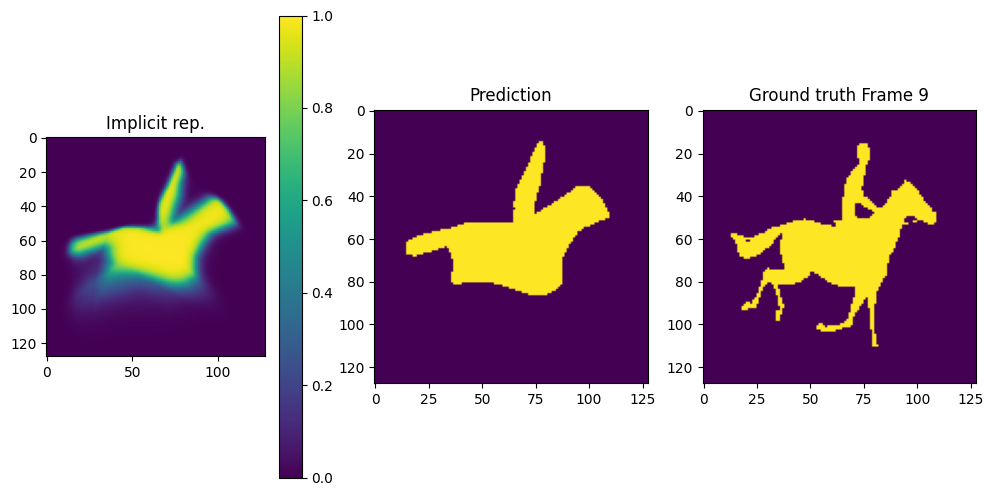

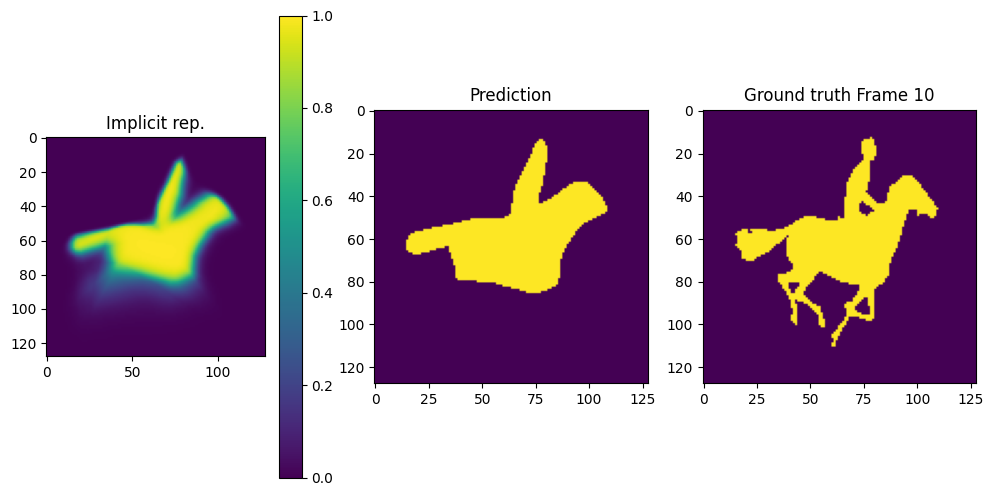

In [93]:
plot_loss_and_accuracy(loss_list,accuracy_list)
plot_implicit_representation_multi_images(images_t, model, device=device)

**Question 5d**
<a name='question5d'></a>

Apply positional encoding for the time dimension.

Write a function that positionally encodes time values, with an optional flag to enable or disable it.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [94]:
def positional_embedding_power_ls(X,L, cst=torch.pi, encode_time_dimension=True):
    #begin_solution
    L = int(L)
    if L <= 0:
        # Return an empty last-dim so in_dim doesn't change
        return X.new_zeros(*X.shape[:-1], 0)

    D = X.shape[-1]
    # If we disable time encoding and D==3, only encode x,y (first 2 dims)
    D_enc = D if (encode_time_dimension or D <= 2) else 2
    coords = X[..., :D_enc]                           # (..., D_enc)

    # Frequency bands: π·2^0, π·2^1, ..., π·2^(L-1)
    freqs = (2.0 ** torch.arange(L, device=X.device, dtype=X.dtype)) * cst  # (L,)
    angles = coords[..., None] * freqs                                       # (..., D_enc, L)

    # Flatten last two dims and keep [cos, sin] ordering (matches earlier cells)
    cos_enc = torch.cos(angles).reshape(*X.shape[:-1], D_enc * L)
    sin_enc = torch.sin(angles).reshape(*X.shape[:-1], D_enc * L)
    encoding = torch.cat([cos_enc, sin_enc], dim=-1)                         # (..., 2*L*D_enc)
    return encoding

    #end_solution


Write a new MLP, while re-using the previous one, that now predicts using the positionally encoded time. It should also predict without positional encoding, for comparison.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [95]:
class MLP_PE_time_option(nn.Module):
    '''
    MLP class
    '''
    def __init__(self,input_dimension, nb_layers, embedding_dimension, output_dimension,
                 positional_enc_L=0,encode_time_dimension=True):
        super(MLP_PE_time_option, self).__init__()
        #begin_solution
        self.L = int(positional_enc_L)
        self.encode_time_dimension = bool(encode_time_dimension)
        self.input_dimension = int(input_dimension)

        # Encode (x,y,t) when enabled; otherwise only (x,y)
        d_enc = self.input_dimension if (self.encode_time_dimension or self.input_dimension <= 2) else 2
        pe_dim = 2 * self.L * d_enc  # [cos, sin] for each freq*dim
        in_dim = self.input_dimension + pe_dim

        # Reuse the original MLP as the backbone (includes the output layer)
        self.backbone = MLP(in_dim, nb_layers, embedding_dimension, output_dimension)
        #end_solution

    def forward(self, input):
        #begin_solution
        if self.L > 0:
            pe = positional_embedding_power_ls(
                input, self.L, cst=torch.pi, encode_time_dimension=self.encode_time_dimension
            )  # (..., 2*L*d_enc)
            input = torch.cat([input, pe], dim=-1)

        prediction = self.backbone(input)  # logits; apply sigmoid outside if needed
        #end_solution

        return prediction


Write the training loop similar to before. Train for a suitable number of epochs and while training populate the lists loss_list and accuracy_list. These lists can be used for plotting later.

Note that this time, the two lists are nested. Each list should contain two sub-lists, one with Positional Encoding turned ON and other with Positional Encoding turned oFF. Each sub-list, similar to before, has scalar loss/acurracy values in each epoch.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [96]:
loss_list, accuracy_list = [[],[]], [[],[]]

# Assign your model to these variables depending on whether they have time encoding or not.
# We'll save these models to disk later
mlp_model_with_time_encoding = None
mlp_model_without_time_encoding = None

#begin_solution
IN_DIM  = 3          # (x, y, t)
HIDDEN  = 128
LAYERS  = 5
OUT_DIM = 1
PE_L    = 6          # frequency bands for PE
EPOCHS  = 200
BATCH_N = 16000      # <= 16000 as required
LR      = 1e-3
EVAL_EVERY = 10

criterion = torch.nn.BCEWithLogitsLoss()

def _train_one(encode_time: bool, slot_idx: int):
    global mlp_model_with_time_encoding, mlp_model_without_time_encoding

    model = MLP_PE_time_option(
        input_dimension=IN_DIM,
        nb_layers=LAYERS,
        embedding_dimension=HIDDEN,
        output_dimension=OUT_DIM,
        positional_enc_L=PE_L,
        encode_time_dimension=encode_time,
    ).to(device)

    opt = torch.optim.Adam(model.parameters(), lr=LR)

    for epoch in range(1, EPOCHS + 1):
        model.train()
        # sample across (x,y,t)
        pos, vals = sample_images(images_t, n=BATCH_N, scaled=True)  # (N,3), (N,)
        pos = pos.to(device)
        y   = vals.float().unsqueeze(1).to(device)

        opt.zero_grad(set_to_none=True)
        logits = model(pos)                     # (N,1) logits
        loss = criterion(logits, y)
        loss.backward()
        opt.step()

        if epoch % EVAL_EVERY == 0 or epoch == 1:
            with torch.no_grad():
                acc = eval_mean_accuracy(images_t, model, device=device)
            loss_list[slot_idx].append((epoch, float(loss.item())))
            accuracy_list[slot_idx].append((epoch, float(acc)))

    if encode_time:
        mlp_model_with_time_encoding = model
    else:
        mlp_model_without_time_encoding = model

# slot 0: time PE ON, slot 1: time PE OFF
_train_one(encode_time=True,  slot_idx=0)
_train_one(encode_time=False, slot_idx=1)
#end_solution

Save the model (needed for marking)

In [97]:
if not os.path.exists("models/"):
  os.makedirs("./models/")
torch.save({"model":mlp_model_with_time_encoding}, "models/implicit_images_sequence_with_time_encoding.pth")
torch.save({"model":mlp_model_without_time_encoding}, "models/implicit_images_sequence_without_time_encoding.pth")

Let's plot both accuracies and loss curves.

Accuracy with time encoding : 0.984 without: 0.954


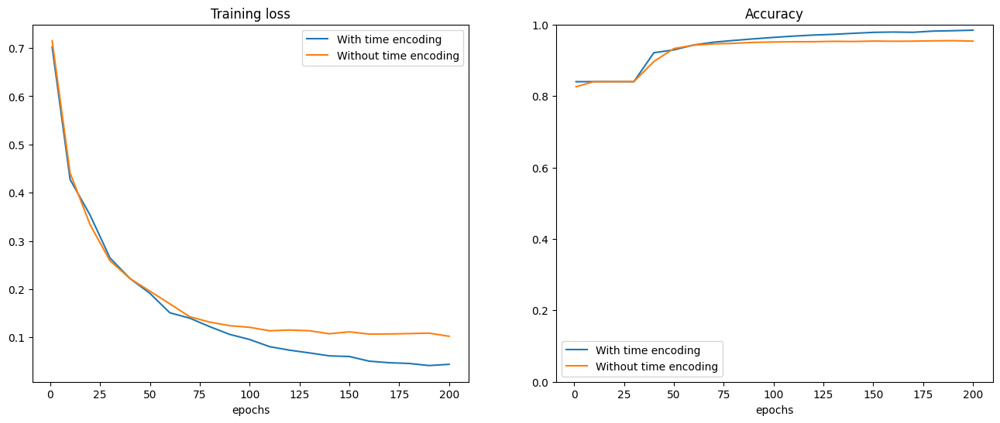

In [98]:
plt.figure(figsize=(8*2,6))

plt.subplot(1,2,1)
plt.plot([x[0] for x in loss_list[0]], [x[1] for x in loss_list[0]], label='With time encoding')
plt.plot([x[0] for x in loss_list[1]], [x[1] for x in loss_list[1]], label='Without time encoding')
plt.title('Training loss')
plt.legend()
plt.xlabel('epochs')

plt.subplot(1,2,2)
plt.plot([x[0] for x in accuracy_list[0]], [x[1] for x in accuracy_list[0]], label='With time encoding')
plt.plot([x[0] for x in accuracy_list[1]], [x[1] for x in accuracy_list[1]], label='Without time encoding')
plt.title('Accuracy')
plt.ylim(0.,1.)
plt.xlabel('epochs')
plt.legend()

print('Accuracy with time encoding : {:.3f} without: {:.3f}'.format(accuracy_list[0][-1][1],accuracy_list[1][-1][1]))

**Question 5e**
<a name='question5e'></a>

Implement batching to prevent memory issues when evaluating large number of pixels with the MLP. Batch size should not exceed 16000.

Write a partition indexing function to create a list of partition indices that can be used to split the input into equal size chunks for prediction

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [99]:
def partition_index(totalsize, chunksize):
    '''
    Args:
        - totalsize: int, Size of the batch to process
        - chunksize: int, subdivision to apply
    Return:
        - list_tuples: List, List of tuples (i,j) to process the batch in equal chunk
    '''
    #begin_solution
    if totalsize is None:
        return []
    totalsize = int(totalsize)
    if totalsize <= 0:
        return []

    # Enforce the 16k cap and valid positive chunk size
    chunksize = max(1, min(int(chunksize), 16000))

    list_tuples = []
    start = 0
    while start < totalsize:
        end = min(start + chunksize, totalsize)
        list_tuples.append((start, end))
        start = end
    #end_solution

    return list_tuples

Update image prediction to use the implemented batch partitioning

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [100]:
def predict_images(images, model, device='cuda', scale=True):
  '''
  Reconstruct the complete set of images from the overfitted MLP model

  Args:
    - images TORCH_INT32 (N_frames, H, W)
    - model, takes as input a batch of pixel positions (K,2) and return pixel value (K,1)
  Return:
    - prediction TORCHFLOAT32 (N_frames, H, W) [CPU]
  '''
  #begin_solution
  if isinstance(images, list):
      images = torch.stack(images, dim=0)
  T, H, W = images.shape

  model = model.to(device).eval()

  # Build full (x, y, t) coordinate list for all frames
  t_idx = torch.arange(T, dtype=torch.float32, device=device).view(T, 1, 1).expand(T, H, W)
  y_idx = torch.arange(H, dtype=torch.float32, device=device).view(1, H, 1).expand(T, H, W)
  x_idx = torch.arange(W, dtype=torch.float32, device=device).view(1, 1, W).expand(T, H, W)

  if scale:
      # Normalize to [0,1]
      x_idx = x_idx / max(W - 1, 1)
      y_idx = y_idx / max(H - 1, 1)
      t_idx = t_idx / max(T - 1, 1)

  coords = torch.stack([x_idx, y_idx, t_idx], dim=-1).reshape(-1, 3)  # (T*H*W, 3)

  preds = []
  with torch.no_grad():
      for i, j in partition_index(coords.size(0), 16000):
          batch = coords[i:j].to(device)              # (B,3)
          out = model(batch)                          # (B,1) or (B,)
          if out.ndim == 2 and out.shape[1] == 1:
              out = out[:, 0]
          # Convert logits to probabilities; harmless if already in [0,1]
          out = torch.sigmoid(out)
          preds.append(out.detach().cpu())

  prediction = torch.cat(preds, dim=0).reshape(T, H, W).to(torch.float32)
  #end_solution


  return prediction


**Question 5f**
<a name='question5f'></a>

Write code to generate a video of 100 frames uniformly sampled between the first and last frame. Save the video as an MP4.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [101]:
output_path = 'result_bw_video.mp4'
#begin_solution
mdl = (
    mlp_model_with_time_encoding
    if "mlp_model_with_time_encoding" in globals() and mlp_model_with_time_encoding is not None
    else model
)
mdl = mdl.to(device).eval()

# Determine spatial size and number of training frames
if "images_t" in globals():
    T_ref, H, W = images_t.shape
else:
    T_ref, H, W = torch.as_tensor(X_resized).shape  # (11, 128, 128)

# Precompute normalized x,y grids in [0,1]
y_idx = torch.arange(H, dtype=torch.float32, device=device).view(H, 1).expand(H, W)
x_idx = torch.arange(W, dtype=torch.float32, device=device).view(1, W).expand(H, W)
x_n = x_idx / max(W - 1, 1)
y_n = y_idx / max(H - 1, 1)

# 100 uniform times between first and last frame, normalized to [0,1]
t_norm_vals = torch.linspace(0.0, 1.0, steps=100, device=device)

# Generate frames with safe batching (<= 16000)
frames = []
with torch.no_grad():
    for t_n in t_norm_vals:
        t_plane = torch.full((H, W), t_n, dtype=torch.float32, device=device)
        coords = torch.stack([x_n, y_n, t_plane], dim=-1).reshape(-1, 3)  # (H*W,3)

        preds = []
        for i, j in partition_index(coords.size(0), 16000):
            batch = coords[i:j]
            out = mdl(batch)
            if out.ndim == 2 and out.shape[1] == 1:
                out = out[:, 0]
            preds.append(torch.sigmoid(out).detach().cpu())

        frame = torch.cat(preds, dim=0).reshape(H, W).numpy()
        frame_bw = (frame > 0.5).astype("uint8") * 255  # binary for video
        frames.append(frame_bw)

# WRITE the MP4 (this was missing)
import imageio
with imageio.get_writer(output_path, mode="I", fps=10) as writer:
    for f in frames:
        writer.append_data(f)
#end_solution

Video(output_path)
